In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
%matplotlib inline

## EDA and Data Prep

In [2]:
xls = pd.ExcelFile('Final Data with Actual.xlsx')
df_cs = pd.read_excel(xls, 'CS')
df_ts = pd.read_excel(xls, 'TS')
df_fs = pd.read_excel(xls, 'FS')

In [3]:
print(df_cs.columns)
print(df_ts.columns)
print(df_fs.columns)

Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
       'Fiber Volume (%)', 'Fibre Elasticity (Mpa)', 'Fibre Diameter (µm)',
       'Aspect ratio ', 'Fiber Density (Kg/m3)', 'Compressive Strength (Mpa)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
       'Fiber Volume (%)', 'Fibre Elasticity (Mpa)', 'Fibre Diameter (µm)',
       'Aspect ratio ', 'Fiber Density (Kg/m3)',
       'Tensile Strain Capacity (%)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
   

In [4]:
df_cs.isnull().sum()

Ref.                          149
S no                            5
Cement                          1
Fly ash C                       1
Sand Zone 2                     0
Sand Zone 3                     0
Sand Zone 4                     1
Limestone                       1
Blast Furnace Slag              1
Silica fume                     1
water/binder                    1
Superplasticizer                1
Fiber Length(mm)                1
Fiber Volume (%)                1
Fibre Elasticity (Mpa)          1
Fibre Diameter (µm)             1
Aspect ratio                  426
Fiber Density (Kg/m3)           1
Compressive Strength (Mpa)      1
dtype: int64

In [5]:
df_cs = df_cs.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_cs[['Superplasticizer']] = df_cs[['Superplasticizer']].fillna(df_cs['Superplasticizer'].mean())
df_cs = df_cs.dropna()
df_cs.isnull().sum()

Cement                        0
Fly ash C                     0
Sand Zone 2                   0
Sand Zone 3                   0
Sand Zone 4                   0
Limestone                     0
Blast Furnace Slag            0
Silica fume                   0
water/binder                  0
Superplasticizer              0
Fiber Length(mm)              0
Fiber Volume (%)              0
Fibre Elasticity (Mpa)        0
Fibre Diameter (µm)           0
Fiber Density (Kg/m3)         0
Compressive Strength (Mpa)    0
dtype: int64

In [6]:
print(len(df_cs))

425


In [7]:
df_ts.isnull().sum()

Ref.                           135
S no                             5
Cement                           1
Fly ash C                        1
Sand Zone 2                      0
Sand Zone 3                      0
Sand Zone 4                      5
Limestone                        1
Blast Furnace Slag               1
Silica fume                      1
water/binder                     1
Superplasticizer                 1
Fiber Length(mm)                 1
Fiber Volume (%)                 1
Fibre Elasticity (Mpa)           1
Fibre Diameter (µm)              1
Aspect ratio                   260
Fiber Density (Kg/m3)            1
Tensile Strain Capacity (%)      1
dtype: int64

In [8]:
df_ts = df_ts.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_ts[['Sand Zone 4']] = df_ts[['Sand Zone 4']].fillna(df_ts['Sand Zone 4'].mean())
df_ts = df_ts.dropna()
df_ts.isnull().sum()

Cement                         0
Fly ash C                      0
Sand Zone 2                    0
Sand Zone 3                    0
Sand Zone 4                    0
Limestone                      0
Blast Furnace Slag             0
Silica fume                    0
water/binder                   0
Superplasticizer               0
Fiber Length(mm)               0
Fiber Volume (%)               0
Fibre Elasticity (Mpa)         0
Fibre Diameter (µm)            0
Fiber Density (Kg/m3)          0
Tensile Strain Capacity (%)    0
dtype: int64

In [9]:
len(df_ts)

259

In [10]:
df_fs.isnull().sum()

Ref.                       131
S no                         5
Cement                       0
Fly ash C                    0
Sand Zone 2                  0
Sand Zone 3                  0
Sand Zone 4                  0
Limestone                    0
Blast Furnace Slag           0
Silica fume                  0
water/binder                 0
Superplasticizer             0
Fiber Length(mm)             0
Fiber Volume (%)             0
Fibre Elasticity (Mpa)       0
Fibre Diameter (µm)          0
Aspect ratio               152
Fiber Density (Kg/m3)        0
Flexural Strength (Mpa)      0
dtype: int64

In [11]:
df_fs = df_fs.drop(['Ref.', 'S no', 'Aspect ratio '], axis=1)

In [12]:
len(df_fs)

152

In [13]:
print(df_cs.nunique(), df_ts.nunique(), df_fs.nunique())

Cement                         15
Fly ash C                      69
Sand Zone 2                     1
Sand Zone 3                     1
Sand Zone 4                    95
Limestone                       7
Blast Furnace Slag              4
Silica fume                     6
water/binder                   66
Superplasticizer               98
Fiber Length(mm)                7
Fiber Volume (%)               49
Fibre Elasticity (Mpa)         12
Fibre Diameter (µm)            11
Fiber Density (Kg/m3)           9
Compressive Strength (Mpa)    195
dtype: int64 Cement                          14
Fly ash C                       50
Sand Zone 2                      1
Sand Zone 3                      1
Sand Zone 4                     73
Limestone                        8
Blast Furnace Slag               6
Silica fume                      6
water/binder                    65
Superplasticizer                82
Fiber Length(mm)                 6
Fiber Volume (%)                38
Fibre Elasticity (Mpa) 

In [14]:
df_cs.describe()

,Cement,Fly ash C,Sand Zone 2,Sand Zone 3,Sand Zone 4,Limestone,Blast Furnace Slag,Silica fume,water/binder,Superplasticizer,Fiber Length(mm),Fiber Volume (%),Fibre Elasticity (Mpa),Fibre Diameter (µm),Fiber Density (Kg/m3),Compressive Strength (Mpa)
count,425.000000,425.000000,425.0,425.0,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000
mean,0.982101,1.472049,0.0,0.0,0.769480,0.046353,0.025412,0.024369,0.453991,0.734290,10.341176,2.343082,41.602353,43.009412,1279.465882,50.232009
std,0.099948,0.865701,0.0,0.0,0.557255,0.307826,0.173515,0.120666,0.413599,2.035424,2.857269,1.103907,4.137478,28.344743,114.119948,18.012086
min,0.231000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.040000,0.000000,6.000000,0.000000,16.900000,12.000000,970.000000,8.000000
25%,1.000000,1.000000,0.0,0.0,0.360000,0.000000,0.000000,0.000000,0.250000,0.012000,8.000000,2.000000,41.000000,39.000000,1300.000000,39.900000
50%,1.000000,1.200000,0.0,0.0,0.800000,0.000000,0.000000,0.000000,0.300000,0.013000,10.000000,2.000000,41.000000,39.000000,1300.000000,50.000000
75%,1.000000,2.200000,0.0,0.0,1.100000,0.000000,0.000000,0.000000,0.600000,0.025300,12.000000,2.000000,42.000000,40.000000,1300.000000,60.000000
max,1.266000,4.400000,0.0,0.0,4.400000,3.000000,1.400000,0.750000,3.600000,16.850000,19.000000,11.210000,66.000000,200.000000,1846.000000,125.710000


In [15]:
df_ts.describe()

,Cement,Fly ash C,Sand Zone 2,Sand Zone 3,Sand Zone 4,Limestone,Blast Furnace Slag,Silica fume,water/binder,Superplasticizer,Fiber Length(mm),Fiber Volume (%),Fibre Elasticity (Mpa),Fibre Diameter (µm),Fiber Density (Kg/m3),Tensile Strain Capacity (%)
count,259.000000,259.000000,259.0,259.0,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000
mean,0.959548,1.523174,0.0,0.0,0.935148,0.129730,0.081853,0.042394,0.441521,1.739616,9.864865,2.508378,41.398069,45.972973,1350.424710,4.145251
std,0.155007,0.954387,0.0,0.0,0.816545,0.533386,0.338858,0.155093,0.326524,2.844681,2.780239,1.208181,2.111824,35.789913,212.694537,1.657313
min,0.231000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,16.900000,12.000000,970.000000,0.000000
25%,1.000000,1.000000,0.0,0.0,0.455000,0.000000,0.000000,0.000000,0.250000,0.012000,8.000000,2.000000,41.000000,39.000000,1300.000000,3.485000
50%,1.000000,1.500000,0.0,0.0,0.800000,0.000000,0.000000,0.000000,0.270000,0.020000,8.000000,2.000000,41.000000,39.000000,1300.000000,4.070000
75%,1.000000,2.200000,0.0,0.0,1.160000,0.000000,0.000000,0.000000,0.685000,3.000000,12.000000,2.600000,42.800000,40.000000,1620.000000,4.750000
max,1.266000,4.400000,0.0,0.0,6.900000,3.300000,2.300000,0.750000,2.000000,16.850000,18.000000,8.710000,42.800000,200.000000,1620.000000,10.750000


In [16]:
df_fs.describe()

,Cement,Fly ash C,Sand Zone 2,Sand Zone 3,Sand Zone 4,Limestone,Blast Furnace Slag,Silica fume,water/binder,Superplasticizer,Fiber Length(mm),Fiber Volume (%),Fibre Elasticity (Mpa),Fibre Diameter (µm),Fiber Density (Kg/m3),Flexural Strength (Mpa)
count,152.0,152.000000,152.0,152.0,152.000000,152.000000,152.000000,152.0,152.000000,152.000000,152.000000,152.000000,152.000000,152.000000,152.000000,152.000000
mean,1.0,1.758375,0.0,0.0,0.874342,0.048684,0.023684,0.0,0.348842,2.323224,9.065789,2.026842,43.772368,52.855263,1531.315789,10.628684
std,0.0,0.798269,0.0,0.0,0.433230,0.323881,0.167465,0.0,0.162052,1.771157,2.883318,0.463297,5.292907,45.149847,143.423996,1.725082
min,1.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.120000,0.012000,8.000000,1.000000,41.000000,38.000000,1300.000000,5.600000
25%,1.0,1.200000,0.0,0.0,0.550000,0.000000,0.000000,0.0,0.270000,0.350000,8.000000,2.000000,42.800000,39.000000,1300.000000,9.520000
50%,1.0,2.196000,0.0,0.0,0.800000,0.000000,0.000000,0.0,0.270000,2.595000,8.000000,2.000000,42.800000,39.000000,1620.000000,10.790000
75%,1.0,2.200000,0.0,0.0,1.160000,0.000000,0.000000,0.0,0.300000,3.600000,8.000000,2.000000,42.800000,39.000000,1620.000000,11.747500
max,1.0,4.400000,0.0,0.0,2.050000,3.000000,1.200000,0.0,0.830000,6.000000,18.000000,4.780000,66.000000,200.000000,1620.000000,15.440000


In [17]:
cs_y = df_cs['Compressive Strength (Mpa)']
ts_y = df_ts['Tensile Strain Capacity (%)']
fs_y = df_fs['Flexural Strength (Mpa)']
cs_x, ts_x, fs_x = df_cs.drop(['Compressive Strength (Mpa)'], axis=1), df_ts.drop(['Tensile Strain Capacity (%)'], axis=1), df_fs.drop(['Flexural Strength (Mpa)'], axis=1)

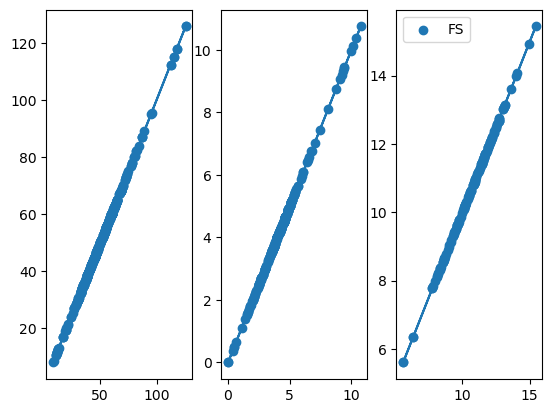

In [18]:
figure, ax = plt.subplots(1,3)
ax[0].scatter(cs_y, cs_y, label='CS')
ax[0].plot(cs_y, cs_y)
ax[1].scatter(ts_y, ts_y, label='TS')
ax[1].plot(ts_y, ts_y)
ax[2].scatter(fs_y, fs_y, label='FS')
ax[2].plot(fs_y, fs_y)
plt.legend()

In [19]:
print(cs_x.shape, ts_x.shape, fs_x.shape)

(425, 15) (259, 15) (152, 15)


In [20]:
print(cs_y.shape, ts_y.shape, fs_y.shape)

(425,) (259,) (152,)


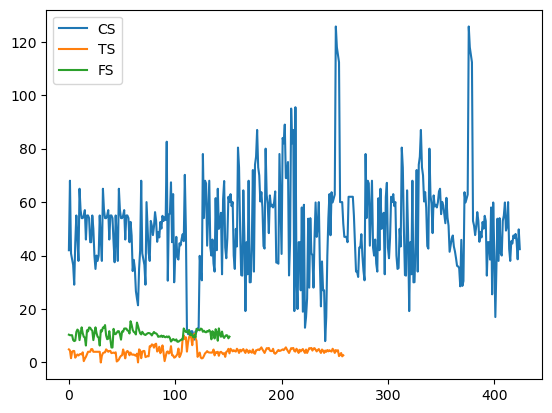

In [21]:
plt.plot(range(len(cs_y)), cs_y, label='CS')
plt.plot(range(len(ts_y)), ts_y, label='TS')
plt.plot(range(len(fs_y)), fs_y, label='FS')
plt.legend()

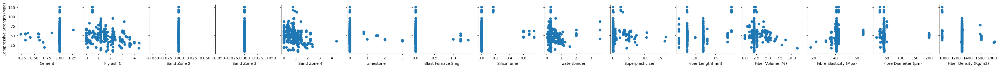

In [22]:
cols = df_cs.columns
y_cols = cols[-1]
x_cols = cols[:-1]
g = sns.PairGrid(df_cs, x_vars=x_cols, y_vars=y_cols)
g = g.map(plt.scatter)

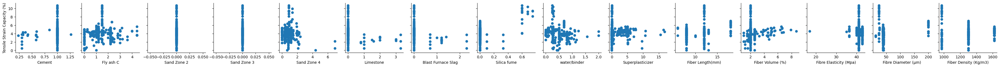

In [23]:
cols = df_ts.columns
y_cols = cols[-1]
x_cols = cols[:-1]
g = sns.PairGrid(df_ts, x_vars=x_cols, y_vars=y_cols)
g = g.map(plt.scatter)

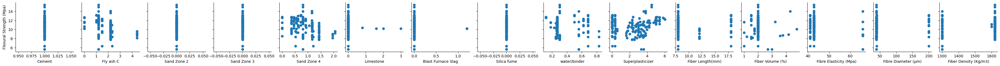

In [24]:
cols = df_fs.columns
y_cols = cols[-1]
x_cols = cols[:-1]
g = sns.PairGrid(df_fs, x_vars=x_cols, y_vars=y_cols)
g = g.map(plt.scatter)

In [25]:
total_x = pd.concat([cs_x, ts_x, fs_x], axis=0)
total_x.shape

(836, 15)

<AxesSubplot:>

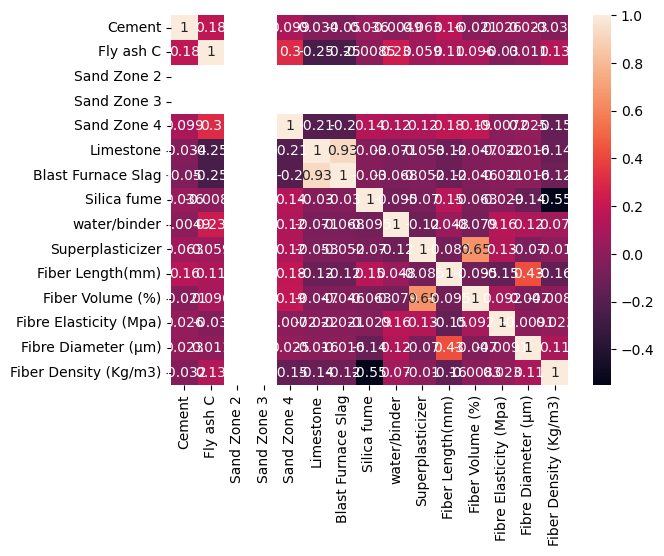

In [26]:
cs_corr = cs_x.corr()
sns.heatmap(cs_corr, annot=True)

<AxesSubplot:>

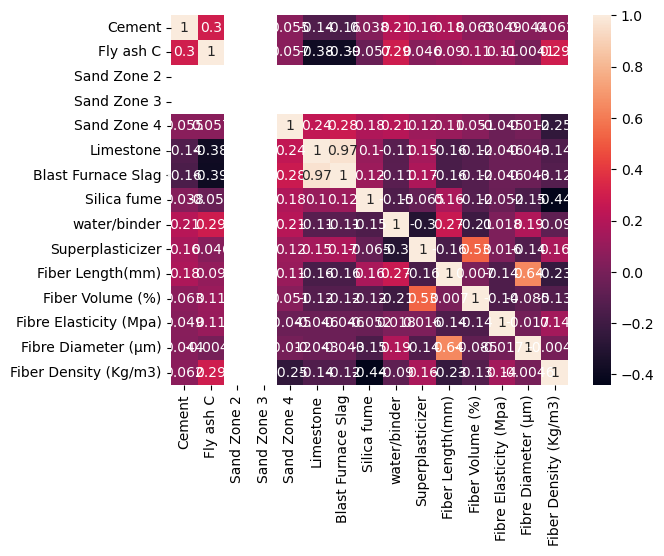

In [27]:
ts_corr = ts_x.corr()
sns.heatmap(ts_corr, annot=True)

<AxesSubplot:>

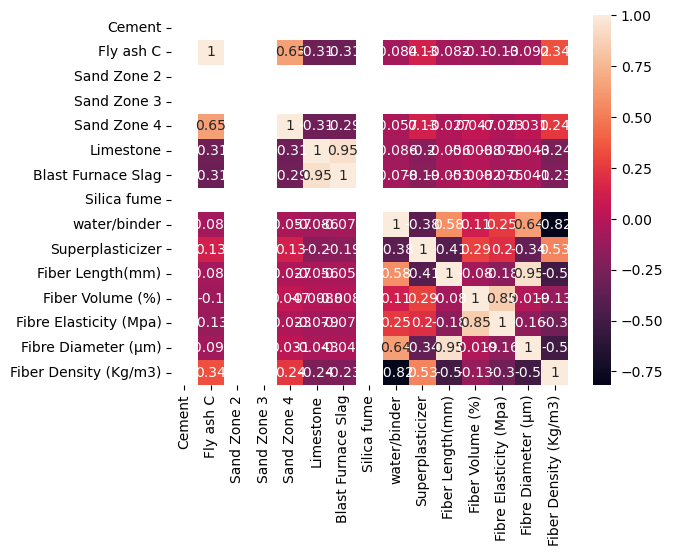

In [28]:
fs_corr = fs_x.corr()
sns.heatmap(fs_corr, annot=True)
# nan because values are constant

In [29]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
cs_x, ts_x, fs_x = min_max_scaler.fit_transform(cs_x), min_max_scaler.fit_transform(ts_x), min_max_scaler.fit_transform(fs_x)

<AxesSubplot:>

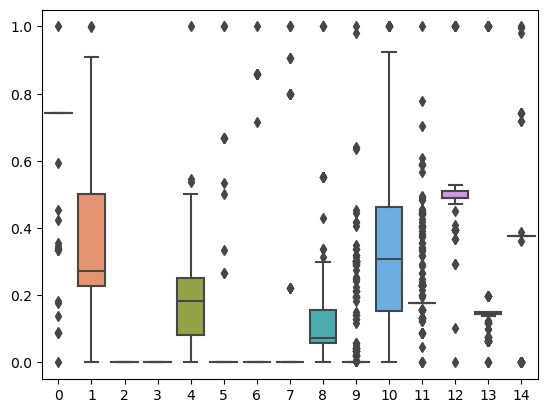

In [30]:
sns.boxplot(data=cs_x)

<AxesSubplot:>

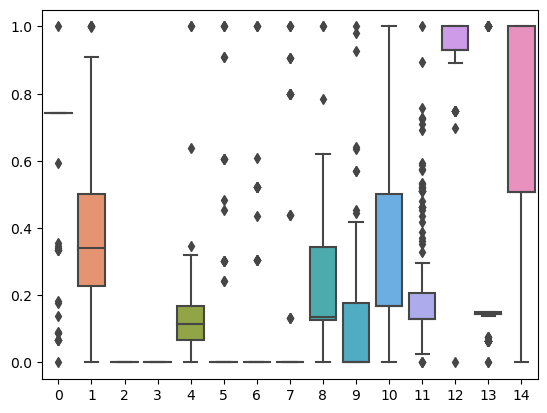

In [31]:
sns.boxplot(data=ts_x)

<AxesSubplot:>

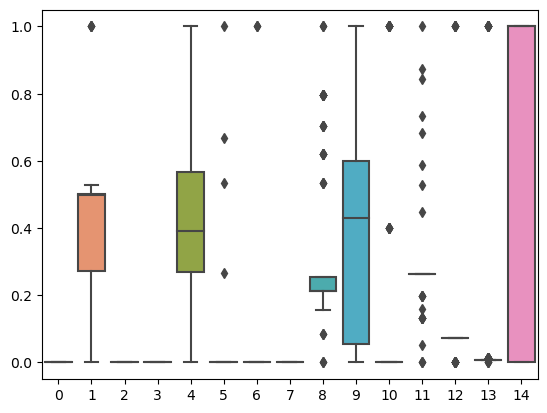

In [32]:
sns.boxplot(data=fs_x)

In [33]:
cs_x_train, cs_x_test, cs_y_train, cs_y_test = train_test_split(cs_x, cs_y, random_state=42, test_size=0.2, shuffle=True)
print(cs_x_train.shape, cs_y_train.shape, cs_x_test.shape)

(340, 15) (340,) (85, 15)


In [34]:
ts_x_train, ts_x_test, ts_y_train, ts_y_test = train_test_split(ts_x, ts_y, random_state=42, test_size=0.2, shuffle=True)
print(ts_x_train.shape, ts_y_train.shape, ts_x_test.shape)

(207, 15) (207,) (52, 15)


In [35]:
fs_x_train, fs_x_test, fs_y_train, fs_y_test = train_test_split(fs_x, fs_y, random_state=42, test_size=0.2, shuffle=True)
print(fs_x_train.shape, fs_y_train.shape, fs_x_test.shape)

(121, 15) (121,) (31, 15)


## Models

In [36]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import KFold, cross_val_score

final_preds = {'CS': [], 'TS': [], 'FS': []}
final_mae = {'CS': [], 'TS': [], 'FS': []}
final_rmse = {'CS': [], 'TS': [], 'FS': []}
final_r2 = {'CS': [], 'TS': [], 'FS': []}

def pipeline(model, train_x, train_y, test_x, test_y, sheet_name):
    model.fit(train_x, train_y)
    pred_train = model.predict(train_x)
    pred_df = pd.DataFrame(pred_train, columns=[str(model)])
    pred_test = model.predict(test_x)
    fig, ax = plt.subplots(1,2)
    fig.set_figheight(10)
    fig.set_figwidth(30)
    ax[0].plot(train_y.values, train_y.values)
    ax[0].plot(1.2*train_y.values, train_y.values, '-')
    ax[0].plot(0.8*train_y.values, train_y.values, '-')
    ax[0].scatter(train_y.values, pred_train)
    mae = []
    print('Train r2: ', r2_score(train_y, pred_train))
    print('Train MAE: ', mean_absolute_error(train_y, pred_train))
    mae.append(mean_absolute_error(train_y, pred_train))
    print('Train RMSE: ', np.sqrt(mean_squared_error(train_y, pred_train)))
    print('Test r2: ', r2_score(test_y, pred_test))
    print('Test MAE: ', mean_absolute_error(test_y, pred_test))
    mae.append(mean_absolute_error(test_y, pred_test))
    print('Test RMSE: ', np.sqrt(mean_squared_error(test_y, pred_test)))
    print('Scatter Index:', np.sqrt(mean_squared_error(train_y, pred_train))/np.mean(pred_train)*100)

    cv = KFold(n_splits=5)
    scores = cross_val_score(model, train_x, train_y, scoring='neg_mean_absolute_error', cv=cv)
    print('K Fold MAE:', -np.mean(scores))
    mae.append(-np.mean(scores))

    ax[1].bar(['Train', 'Test', 'KFold'], mae)

    figure, axis = plt.subplots(2, 1)
    figure.set_figheight(15)
    figure.set_figwidth(30)
    final_preds[sheet_name].append({str(model): pred_train})
    final_mae[sheet_name].append({str(model): mae[-1]})
    final_r2[sheet_name].append({str(model): r2_score(train_y, pred_train)})
    final_rmse[sheet_name].append({str(model): np.sqrt(mean_squared_error(train_y, pred_train))})

    axis[0].plot(range(len(test_x)), pred_test, label='Pred')
    axis[0].plot(range(len(test_x)), test_y, label='Orig')

    axis[1].plot(range(len(train_x)), pred_train, label='Pred')
    axis[1].plot(range(len(train_x)), train_y, label='Orig')
    plt.legend()
    plt.title(str(model))


### Linear Regression

Train r2:  0.26701756875342775
Train MAE:  11.691731164209513
Train RMSE:  16.087439038942975
Test r2:  0.05575376083792816
Test MAE:  10.597169840726163
Test RMSE:  13.937420431052853
Scatter Index: 31.94907517008523
K Fold MAE: 12.254743847553613
Coefficients: [ 1.02630612e+01 -1.81828913e+01 -7.10542736e-15  3.55271368e-14
 -3.32491985e+01 -5.20354688e+01  9.88424173e+00 -1.43712144e+01
 -3.86552378e-01  4.70701459e-01  6.87908234e-01 -6.30926680e+00
  3.09410056e+01  1.57710107e+00 -6.64046698e+01]


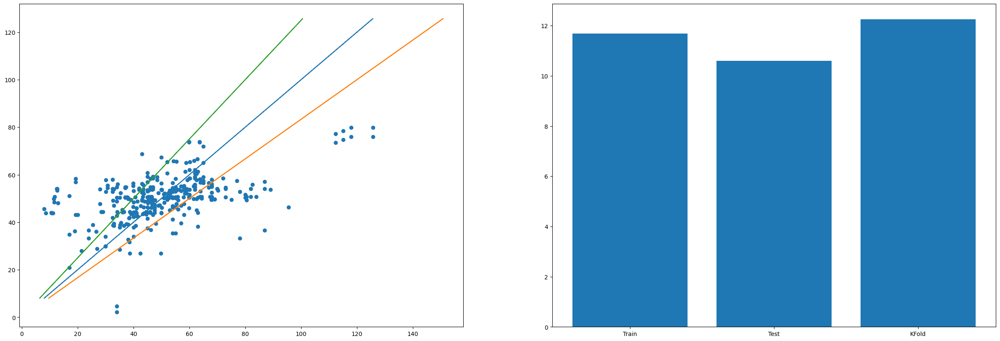

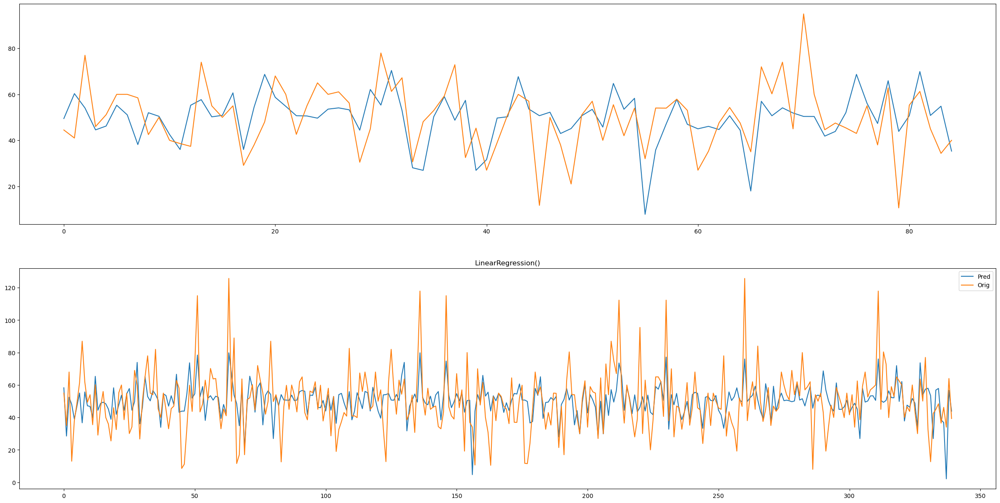

In [37]:
from sklearn.linear_model import LinearRegression
train_cs = pd.DataFrame(cs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')
print('Coefficients:', model.coef_)

Train r2:  0.6270964969221657
Train MAE:  0.7255856634237549
Train RMSE:  0.9524651318252711
Test r2:  0.6427509904065973
Test MAE:  0.8549903019728757
Test RMSE:  1.1540359071152277
Scatter Index: 22.413491989749463
K Fold MAE: 0.7789234203223885
Coefficients: [ 8.47800169e-01 -3.97605439e-01  2.22044605e-16  0.00000000e+00
 -2.01153527e+00 -2.20203295e+00 -3.56292972e-01  6.42491153e+00
 -4.00934390e-01 -3.58782195e-01 -1.54645932e-01  2.38919117e+00
 -6.24169396e-01  2.59976995e+00  1.38833399e+00]


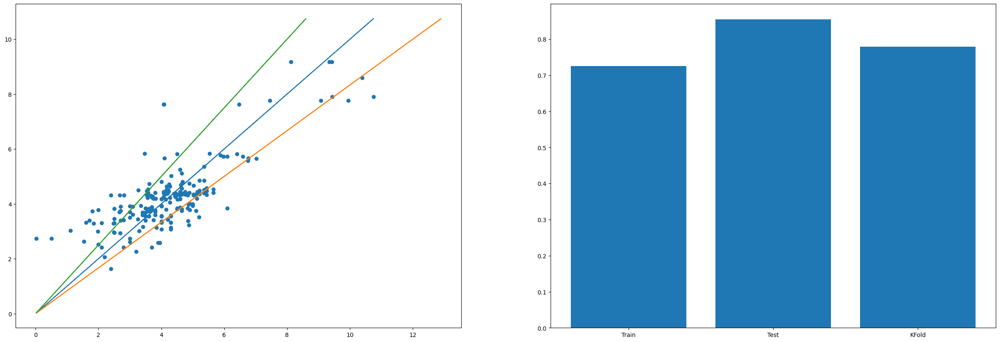

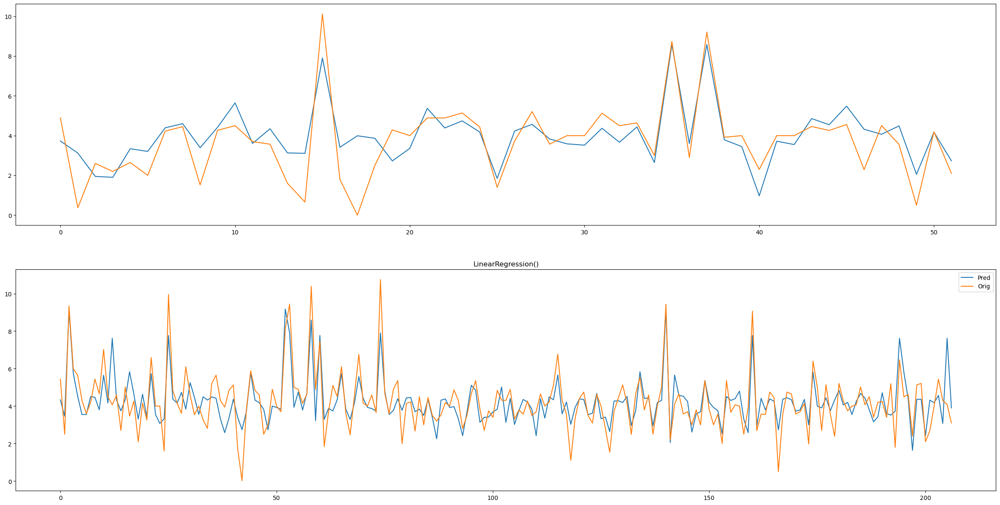

In [38]:
train_ts = pd.DataFrame(ts_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')
print('Coefficients:', model.coef_)

Train r2:  0.38759722611823977
Train MAE:  1.0848655986887643
Train RMSE:  1.3836491735775744
Test r2:  0.22073901659663975
Test MAE:  0.9519512285899528
Test RMSE:  1.2087443624436969
Scatter Index: 13.201718210576304
K Fold MAE: 1.2481915893494295
Coefficients: [ 0.00000000e+00 -3.25859237e+00 -3.55271368e-15 -6.66133815e-16
 -2.05002234e+00 -3.47048675e+00 -9.37615597e-01 -8.88178420e-16
 -6.33079478e-01  9.06691002e-01 -3.71621677e+00  7.53251843e+00
 -6.29387698e+00  3.02257307e+00 -4.92827826e-01]


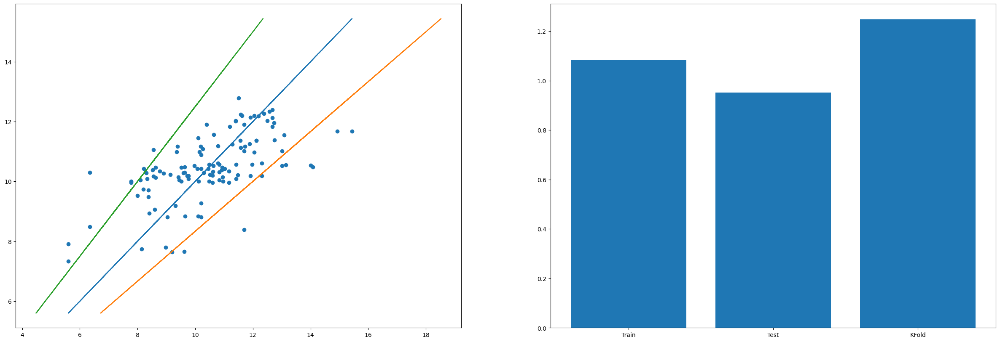

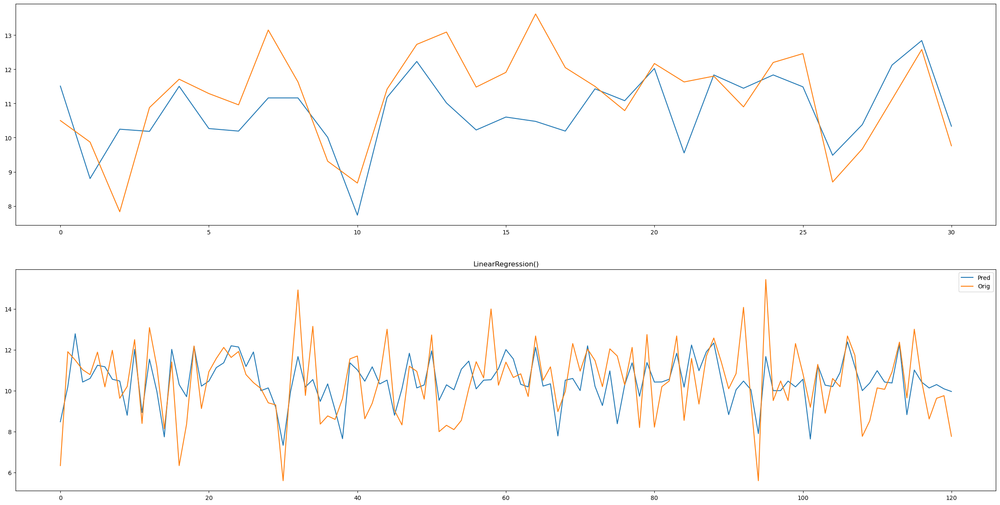

In [39]:
train_fs = pd.DataFrame(fs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')
print('Coefficients:', model.coef_)

### Ridge Regression

Train r2:  0.2617416408574271
Train MAE:  11.662742538499874
Train RMSE:  16.145233045759955
Test r2:  0.09446655679291349
Test MAE:  10.287577401217545
Test RMSE:  13.648722887505599
Scatter Index: 32.063851988428205
K Fold MAE: 12.119164142695553
Coefficients: [  8.48276162 -18.34003959   0.           0.         -29.43533738
 -17.42193252 -10.23890848  -9.71482813  -0.16906964   0.81586915
   1.2749765   -5.78896591  26.38943918   0.89826127 -56.11758781]


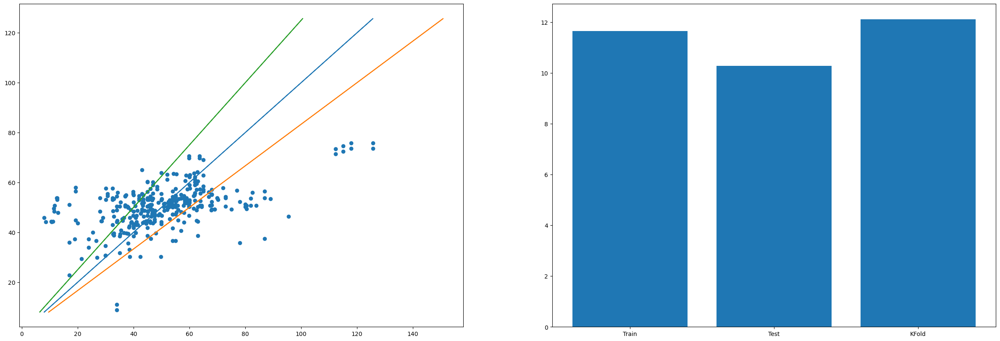

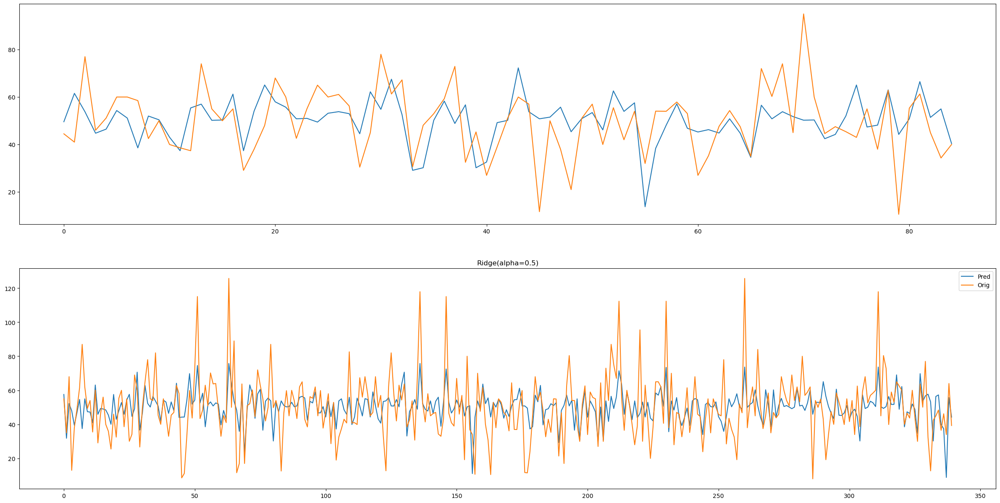

In [40]:
from sklearn.linear_model import Ridge
model = Ridge(alpha=0.5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')
print('Coefficients:', model.coef_)

Train r2:  0.6196831081897167
Train MAE:  0.7281517874598928
Train RMSE:  0.9618861285663517
Test r2:  0.6248811271574107
Test MAE:  0.8550938284456021
Test RMSE:  1.1825465965169684
Scatter Index: 22.63518770115782
K Fold MAE: 0.7808058387458408
Coefficients: [ 0.74227344 -0.27759658  0.          0.         -1.6721033  -1.31529824
 -1.07240982  5.70273742 -0.64688827 -0.15686514  0.23508233  1.775117
 -0.39791664  2.09499864  1.17353657]


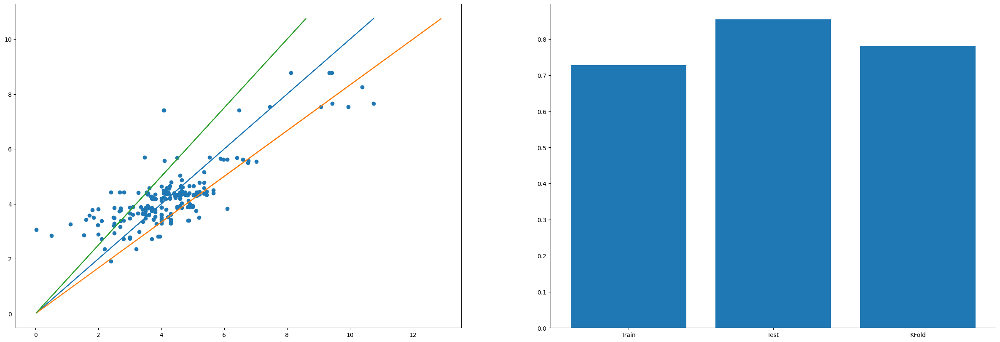

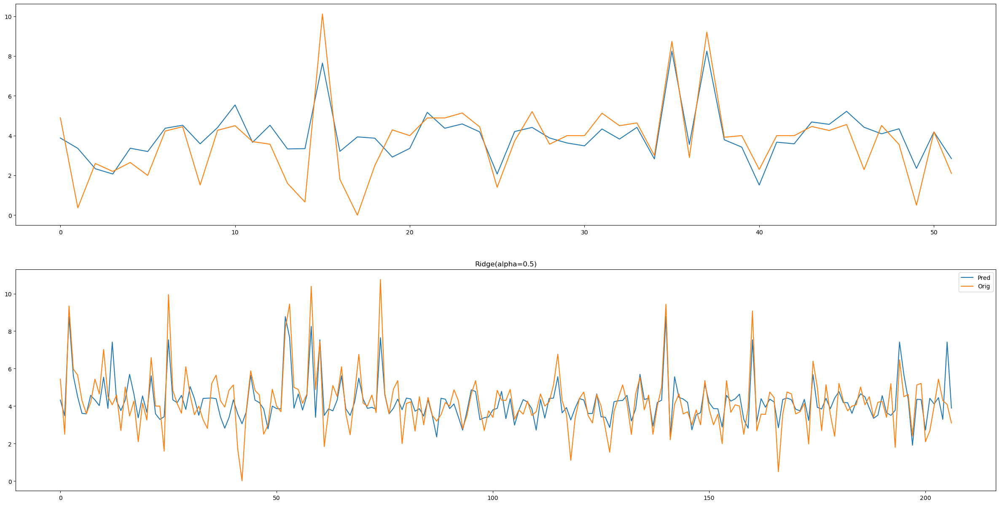

In [41]:
model = Ridge(alpha=0.5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')
print('Coefficients:', model.coef_)

Train r2:  0.345608222064944
Train MAE:  1.088640399510637
Train RMSE:  1.4302973383558273
Test r2:  0.24317306144713702
Test MAE:  0.9274161597964256
Test RMSE:  1.1912181075205082
Scatter Index: 13.646799187895656
K Fold MAE: 1.1857199789209194
Coefficients: [ 0.         -3.07649014  0.          0.         -1.6801209  -1.11767185
 -1.21166417  0.         -0.3035784   0.9321457  -1.9172921   2.62298558
 -2.99466834  1.89569295  0.19298614]


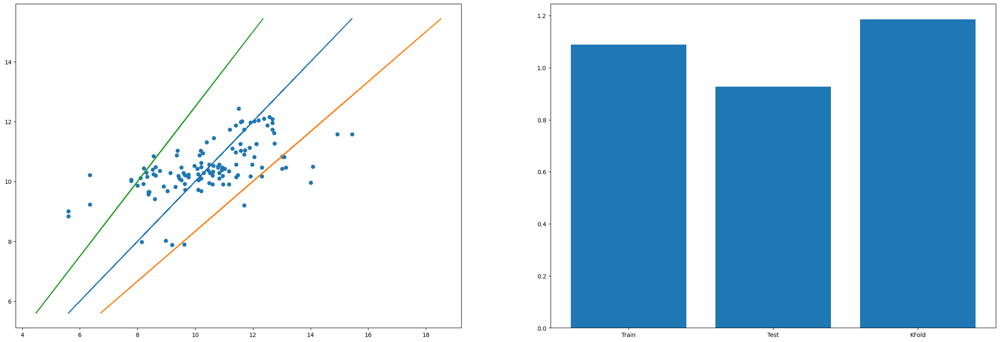

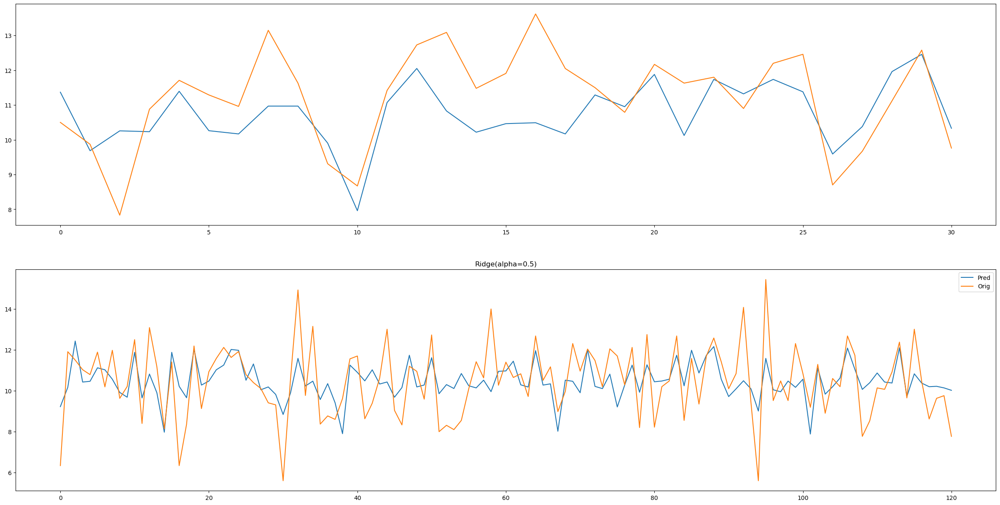

In [42]:
model = Ridge(alpha=0.5)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')
print('Coefficients:', model.coef_)

### Lasso Regression

Train r2:  0.2590307405817245
Train MAE:  11.716492209200702
Train RMSE:  16.1748487015885
Test r2:  0.04901953072185461
Test MAE:  10.7179289844115
Test RMSE:  13.987031984425228
Scatter Index: 32.12266761545177
K Fold MAE: 12.175637428164386
Coefficients: [  3.82193607 -17.13067895   0.           0.         -29.59605415
 -14.52713146  -8.45031978  -8.90885261   0.          -0.
   0.56396516  -1.15088896  24.85510993   0.         -58.10099343]


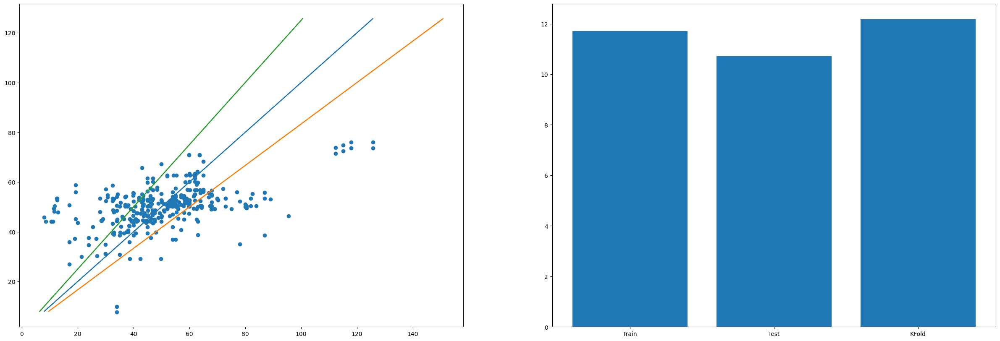

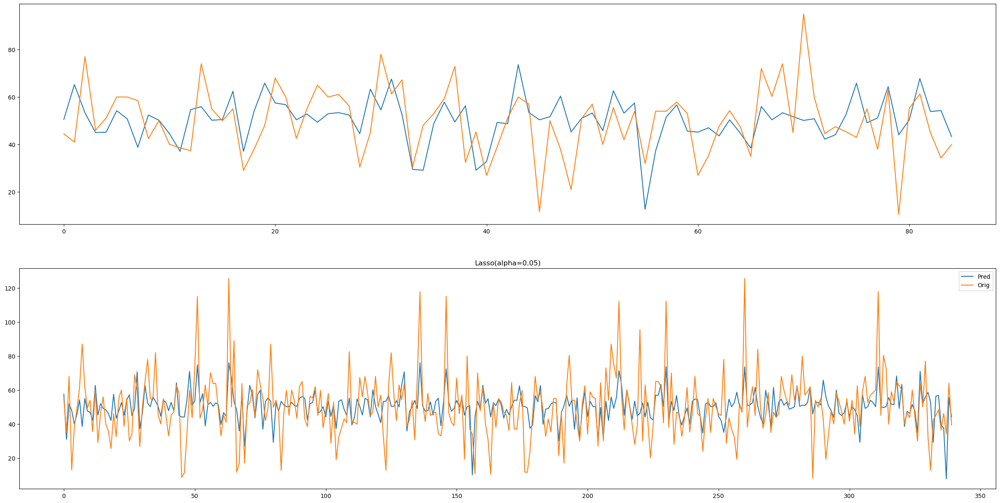

In [43]:
from sklearn.linear_model import Lasso
model = Lasso(alpha=0.05)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')
print('Coefficients:', model.coef_)

Train r2:  0.607925406829699
Train MAE:  0.7411641695779764
Train RMSE:  0.9766415671731293
Test r2:  0.6015238910517763
Test MAE:  0.8833211274946995
Test RMSE:  1.2188070258718906
Scatter Index: 22.982413960647733
K Fold MAE: 0.8032913532974435
Coefficients: [ 0.21004189 -0.          0.          0.         -1.31456032 -2.06562413
 -0.          5.76969384 -0.2969686   0.          0.          1.48182134
 -0.          2.14792591  1.05783148]


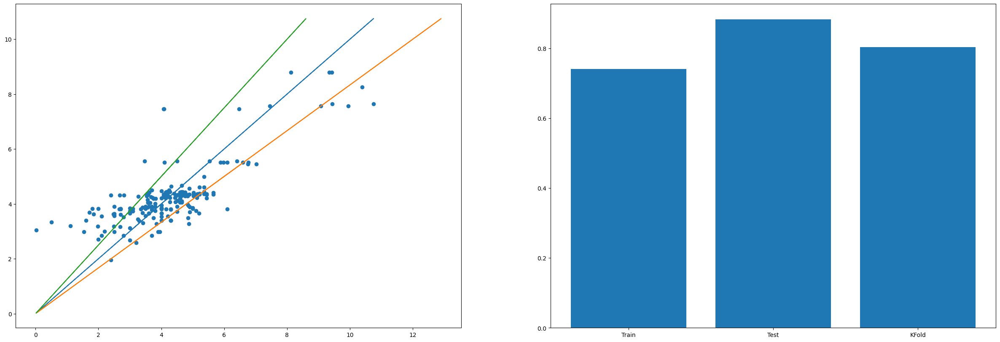

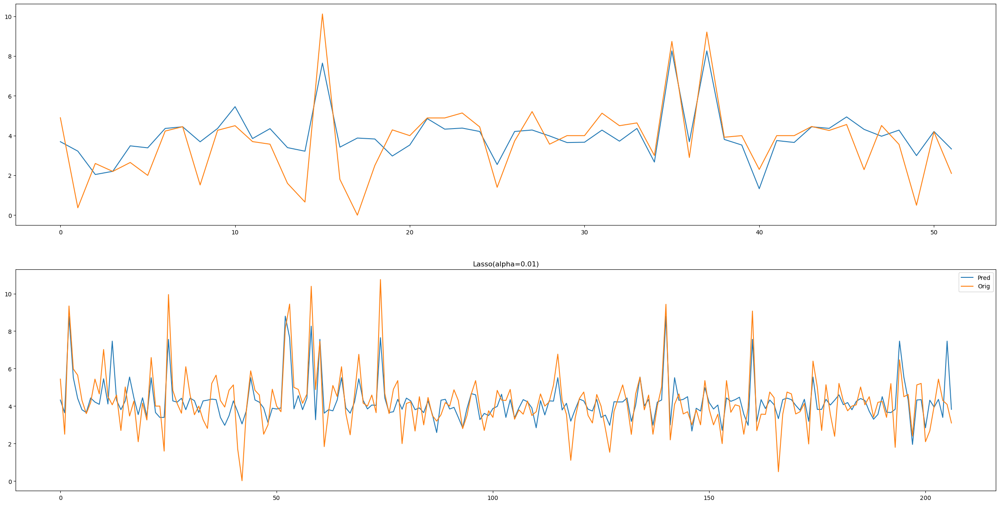

In [44]:
model = Lasso(alpha=0.01)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')
print('Coefficients:', model.coef_)

Train r2:  0.38686366252818527
Train MAE:  1.0823466431845774
Train RMSE:  1.3844776241731338
Test r2:  0.22411868364552523
Test MAE:  0.9478567003852445
Test RMSE:  1.2061203426645897
Scatter Index: 13.209622650171834
K Fold MAE: 1.2241751461574484
Coefficients: [ 0.         -3.34483141  0.          0.         -1.94541518 -2.93569906
 -1.07542642  0.         -0.34137205  0.89265041 -3.31804842  7.18762761
 -6.04572817  2.62484414 -0.31340668]


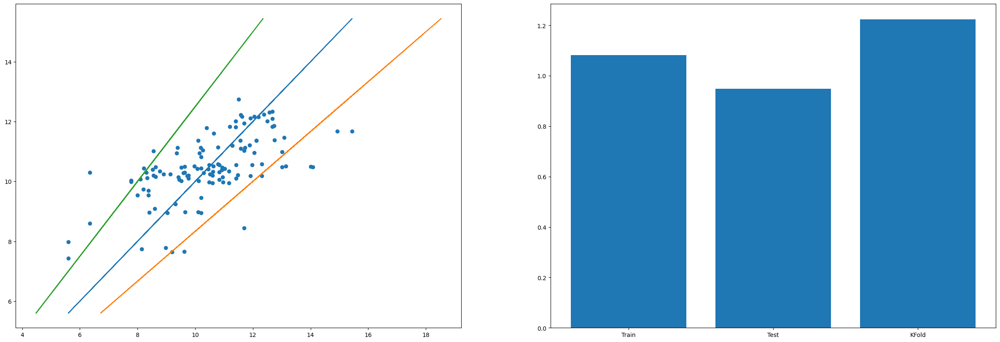

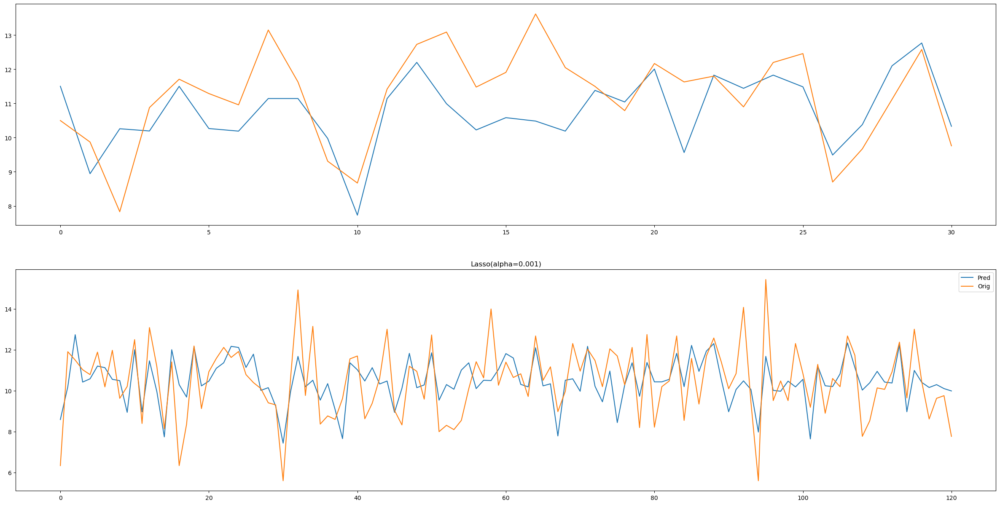

In [45]:
model = Lasso(alpha=0.001)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')
print('Coefficients:', model.coef_)

### Symbolic Regression

In [52]:
from gplearn.genetic import SymbolicRegressor

function_set = ['add', 'sub', 'mul', 'div','cos','sin','neg','inv']
est_gp = SymbolicRegressor(population_size=5000,function_set=function_set,
                            generations=40, stopping_criteria=0.01,
                            p_crossover=0.7, p_subtree_mutation=0.1,
                            p_hoist_mutation=0.05, p_point_mutation=0.1,
                            max_samples=0.9, verbose=1,
                            parsimony_coefficient=0.01, random_state=0)
converter = {
    'sub': lambda x, y : x - y,
    'div': lambda x, y : x/y,
    'mul': lambda x, y : x*y,
    'add': lambda x, y : x + y,
    'neg': lambda x    : -x,
    'pow': lambda x, y : x**y,
    'sin': lambda x    : sin(x),
    'cos': lambda x    : cos(x),
    'inv': lambda x: 1/x,
    'sqrt': lambda x: x**0.5,
    'pow3': lambda x: x**3
}

est_gp.fit(cs_x_train, cs_y_train)# print('R2:',est_gp.score(cs_x_test,cs_y_test))

    |   Population Average    |             Best Individual              |
---- ------------------------- ------------------------------------------ ----------
 Gen   Length          Fitness   Length          Fitness      OOB Fitness  Time Left
   0     9.90          56.0666       19          21.3833          24.0535      1.15m
   1    10.37          55.4775        5          17.9908          18.7668      1.29m
   2    18.98          60.9962       33          16.6695          19.0333      1.39m
   3    19.24          71.2596       15          15.3262          17.7174      1.35m
   4    22.61          70.0389       15          15.3255          17.7237      1.39m
   5    24.46          65.2926       18          14.8952           20.245      1.40m
   6    27.88          55.6533       19          14.7984          19.6531      1.55m
   7    28.28          43.5561       33          14.3566          17.4403      1.42m
   8    21.98          40.0053       26          14.1231          17.7596  

SymbolicRegressor(function_set=['add', 'sub', 'mul', 'div', 'cos', 'sin', 'neg',
                                'inv'],
                  generations=40, max_samples=0.9, p_crossover=0.7,
                  p_hoist_mutation=0.05, p_point_mutation=0.1,
                  p_subtree_mutation=0.1, parsimony_coefficient=0.01,
                  population_size=5000, random_state=0, stopping_criteria=0.01,
                  verbose=1)

In [53]:
from sympy import *
next_e = sympify((est_gp._program), locals=converter)
next_e

/var/folders/v5/xcmh9ggx69z1z5l8wnzf8fmm0000gn/T/ipykernel_41850/1875855434.py:2: SymPyDeprecationWarning: 

The string fallback in sympify() is deprecated.

To explicitly convert the string form of an object, use
sympify(str(obj)). To add define sympify behavior on custom
objects, use sympy.core.sympify.converter or define obj._sympy_
(see the sympify() docstring).

sympify() performed the string fallback resulting in the following string:

'add(inv(sub(inv(X10), cos(X7))), add(inv(sub(cos(inv(X13)), inv(X6))), inv(div(add(div(neg(mul(X4, X1)), inv(sin(-0.592))), sin(0.262)), add(add(inv(X13), add(sub(div(X13, 0.120), mul(X4, X1)), mul(add(add(inv(X12), X14), mul(sin(X12), div(X10, X3))), mul(cos(X13), X10)))), inv(X10))))))'

See https://docs.sympy.org/latest/explanation/active-deprecations.html#deprecated-sympify-string-fallback
for details.

This has been deprecated since SymPy version 1.6. It
will be removed in a future version of SymPy.

  next_e = sympify((est_gp._program), loca

1/(-cos(X7) + 1/X10) + 1/(cos(1/X13) - 1/X6) + (-X1*X4 + X10*(X10*sin(X12)/X3 + X14 + 1/X12)*cos(X13) + 8.33333333333333*X13 + 1/X13 + 1/X10)/(0.558021790441388*X1*X4 + 0.259012816398972)

Text(0.5, 1.0, 'Lasso(alpha=0.001)')

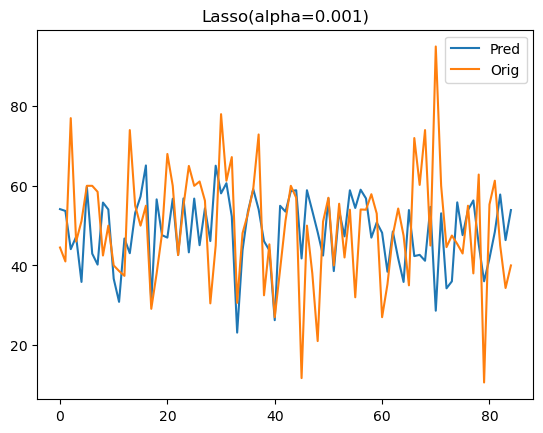

In [54]:
preds = est_gp.predict(cs_x_test)
plt.plot(range(len(cs_x_test)), preds, label='Pred')
plt.plot(range(len(cs_x_test)), cs_y_test, label='Orig')
plt.legend()
plt.title(str(model))

### Decision Tree Regressor

Train r2:  0.5629528161375126
Train MAE:  8.965383728903946
Train RMSE:  12.422365255947533
Test r2:  0.27517125420856847
Test MAE:  9.028175980015673
Test RMSE:  12.211175511737663
Scatter Index: 24.67037049164795
K Fold MAE: 11.84952690919032


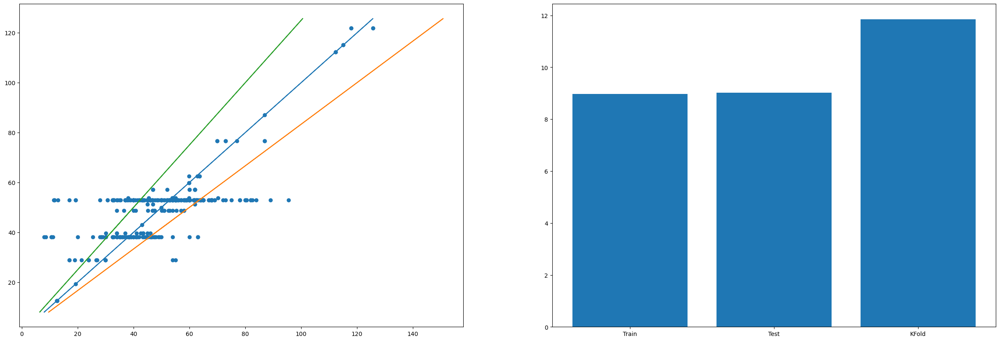

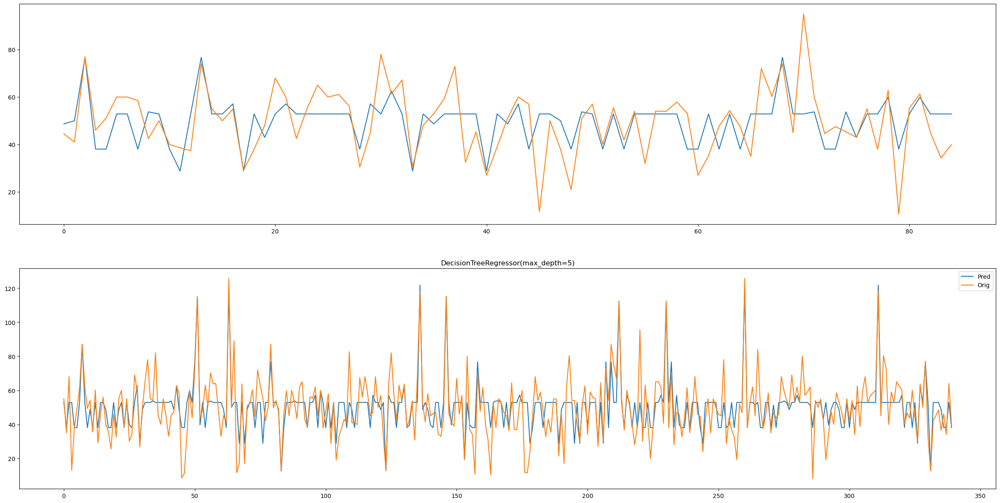

In [55]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(max_depth = 5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [56]:
from sklearn import tree
text_representation = tree.export_text(model)
print(text_representation)


|--- feature_14 <= 0.18
|   |--- feature_1 <= 0.23
|   |   |--- feature_9 <= 0.00
|   |   |   |--- value: [50.00]
|   |   |--- feature_9 >  0.00
|   |   |   |--- feature_4 <= 0.19
|   |   |   |   |--- feature_11 <= 0.19
|   |   |   |   |   |--- value: [121.81]
|   |   |   |   |--- feature_11 >  0.19
|   |   |   |   |   |--- value: [121.81]
|   |   |   |--- feature_4 >  0.19
|   |   |   |   |--- feature_4 <= 0.23
|   |   |   |   |   |--- value: [115.08]
|   |   |   |   |--- feature_4 >  0.23
|   |   |   |   |   |--- value: [112.33]
|   |--- feature_1 >  0.23
|   |   |--- feature_1 <= 0.42
|   |   |   |--- feature_8 <= 0.12
|   |   |   |   |--- feature_9 <= 0.00
|   |   |   |   |   |--- value: [51.33]
|   |   |   |   |--- feature_9 >  0.00
|   |   |   |   |   |--- value: [57.11]
|   |   |   |--- feature_8 >  0.12
|   |   |   |   |--- feature_9 <= 0.12
|   |   |   |   |   |--- value: [62.53]
|   |   |   |   |--- feature_9 >  0.12
|   |   |   |   |   |--- value: [59.88]
|   |   |--- featur

Train r2:  0.7409206826524035
Train MAE:  0.6120575267921594
Train RMSE:  0.7939026037172423
Test r2:  0.611489169008882
Test MAE:  0.9279467838196287
Test RMSE:  1.2034702819459178
Scatter Index: 18.682184842774873
K Fold MAE: 0.7861241666442713


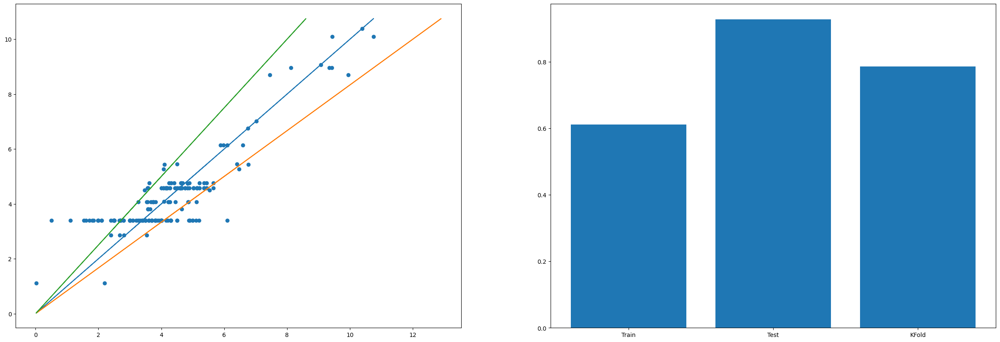

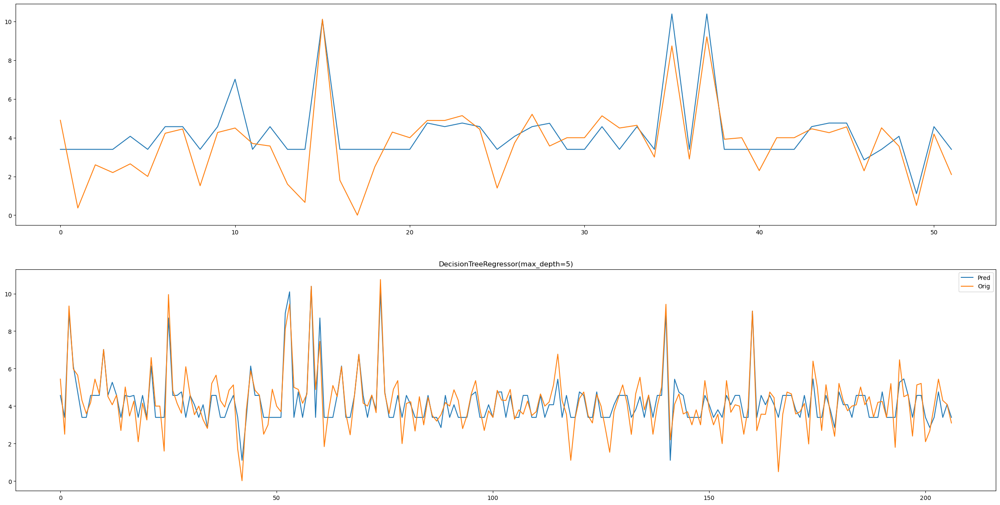

In [57]:
model = DecisionTreeRegressor(max_depth = 5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [58]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_7 <= 0.62
|   |--- feature_13 <= 0.57
|   |   |--- feature_14 <= 0.75
|   |   |   |--- feature_11 <= 0.31
|   |   |   |   |--- feature_4 <= 0.49
|   |   |   |   |   |--- value: [3.40]
|   |   |   |   |--- feature_4 >  0.49
|   |   |   |   |   |--- value: [1.11]
|   |   |   |--- feature_11 >  0.31
|   |   |   |   |--- feature_11 <= 0.52
|   |   |   |   |   |--- value: [4.07]
|   |   |   |   |--- feature_11 >  0.52
|   |   |   |   |   |--- value: [4.76]
|   |   |--- feature_14 >  0.75
|   |   |   |--- feature_11 <= 0.11
|   |   |   |   |--- feature_12 <= 0.98
|   |   |   |   |   |--- value: [4.75]
|   |   |   |   |--- feature_12 >  0.98
|   |   |   |   |   |--- value: [2.85]
|   |   |   |--- feature_11 >  0.11
|   |   |   |   |--- feature_1 <= 0.95
|   |   |   |   |   |--- value: [4.57]
|   |   |   |   |--- feature_1 >  0.95
|   |   |   |   |   |--- value: [3.80]
|   |--- feature_13 >  0.57
|   |   |--- feature_4 <= 0.12
|   |   |   |--- feature_1 <= 0.25
|   |   |   |   |--

Train r2:  0.5674059597787815
Train MAE:  0.8094495985791228
Train RMSE:  1.162914215589547
Test r2:  0.22105656739748214
Test MAE:  0.8789527758115078
Test RMSE:  1.2084980541720378
Scatter Index: 11.095634695889792
K Fold MAE: 1.0075486492272347


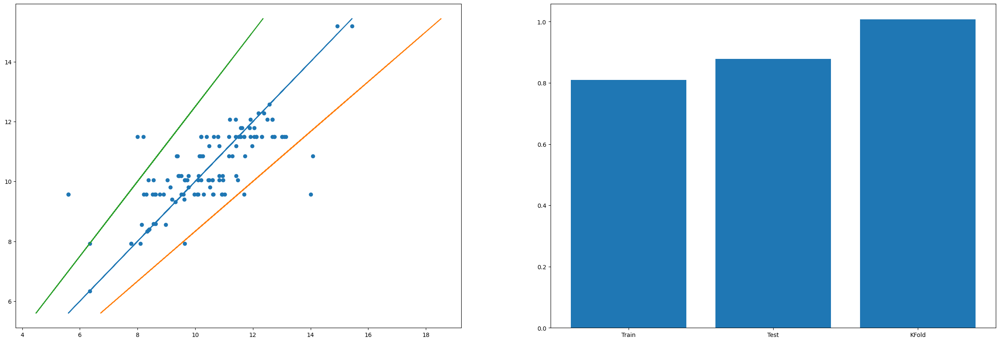

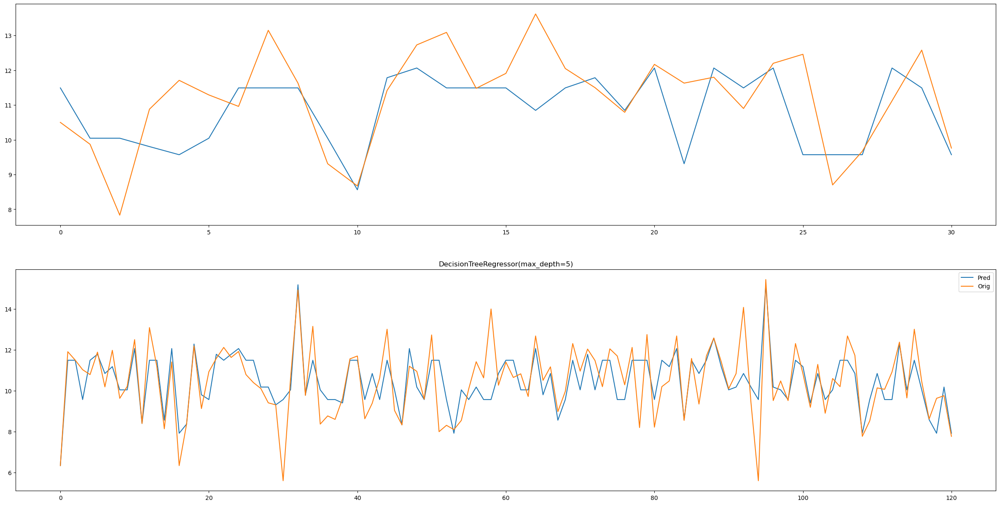

In [59]:
model = DecisionTreeRegressor(max_depth = 5)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [60]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_9 <= 0.66
|   |--- feature_4 <= 0.58
|   |   |--- feature_11 <= 0.09
|   |   |   |--- feature_4 <= 0.28
|   |   |   |   |--- value: [6.34]
|   |   |   |--- feature_4 >  0.28
|   |   |   |   |--- feature_11 <= 0.03
|   |   |   |   |   |--- value: [9.31]
|   |   |   |   |--- feature_11 >  0.03
|   |   |   |   |   |--- value: [8.40]
|   |   |--- feature_11 >  0.09
|   |   |   |--- feature_9 <= 0.40
|   |   |   |   |--- feature_1 <= 0.50
|   |   |   |   |   |--- value: [11.49]
|   |   |   |   |--- feature_1 >  0.50
|   |   |   |   |   |--- value: [10.04]
|   |   |   |--- feature_9 >  0.40
|   |   |   |   |--- feature_1 <= 0.50
|   |   |   |   |   |--- value: [9.57]
|   |   |   |   |--- feature_1 >  0.50
|   |   |   |   |   |--- value: [10.85]
|   |--- feature_4 >  0.58
|   |   |--- feature_8 <= 0.23
|   |   |   |--- feature_9 <= 0.36
|   |   |   |   |--- feature_4 <= 0.98
|   |   |   |   |   |--- value: [8.56]
|   |   |   |   |--- feature_4 >  0.98
|   |   |   |   |   |--- val

### Random Forest

Train r2:  0.5865429815409542
Train MAE:  9.124565539772581
Train RMSE:  12.082458603804222
Test r2:  0.24105137795970444
Test MAE:  9.129271475157095
Test RMSE:  12.495278995384005
Scatter Index: 23.946719255741318
K Fold MAE: 11.018583739062924


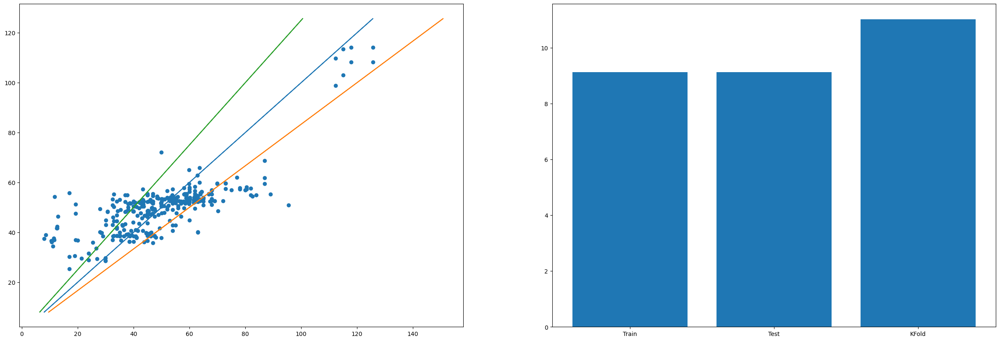

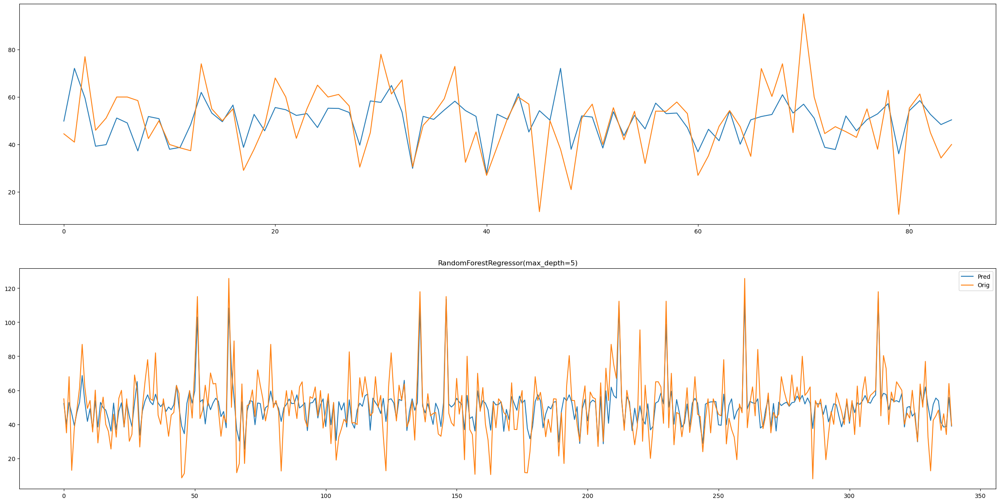

In [61]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth = 5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [62]:
pickle.dump(model, open('cs.sav', 'wb'))

Train r2:  0.7738060836039966
Train MAE:  0.5851611704018843
Train RMSE:  0.7418076612631636
Test r2:  0.6626393367500287
Test MAE:  0.8246857561311642
Test RMSE:  1.12145286820749
Scatter Index: 17.404771584716595
K Fold MAE: 0.7447810508150353


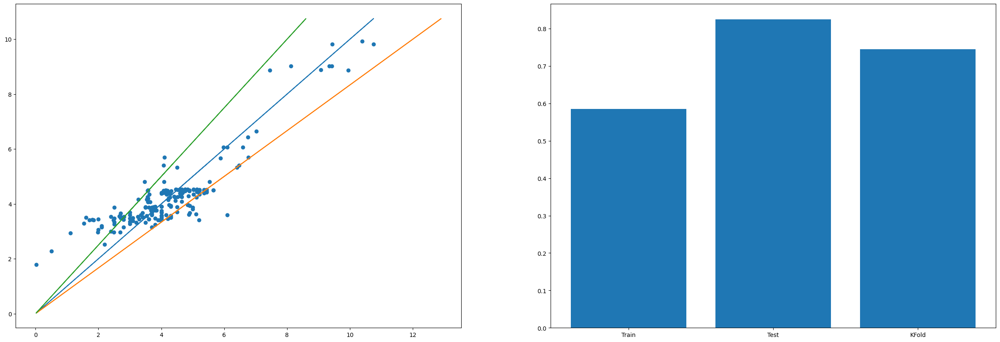

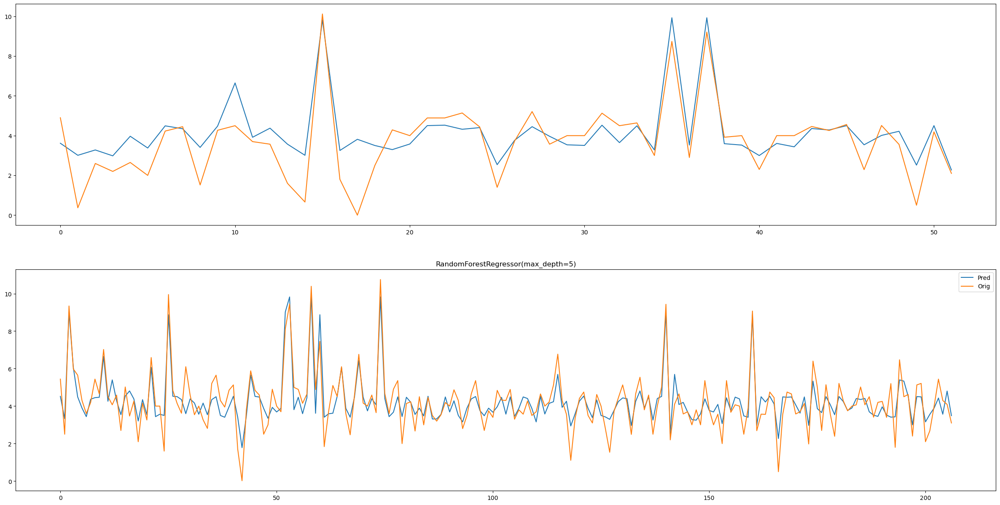

In [63]:
model = RandomForestRegressor(max_depth = 5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [64]:
pickle.dump(model, open('ts.sav', 'wb'))

Train r2:  0.6031628825786124
Train MAE:  0.8369769196206229
Train RMSE:  1.113816267615397
Test r2:  0.3846083339488633
Test MAE:  0.8580390163962475
Test RMSE:  1.0741595666591797
Scatter Index: 10.636918462878944
K Fold MAE: 1.0556839769153987


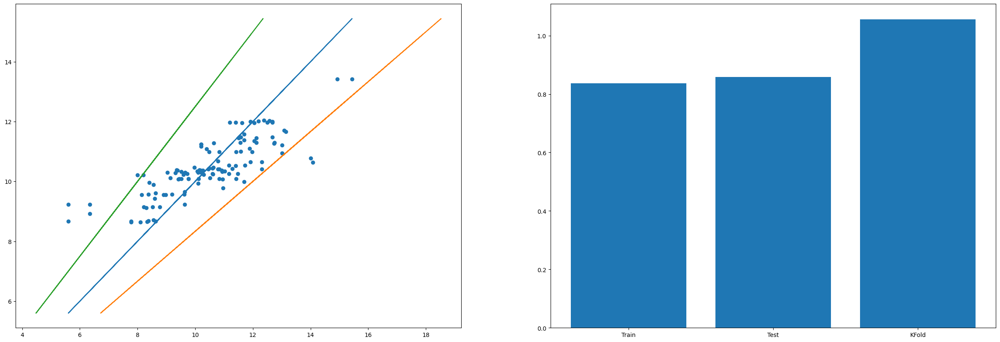

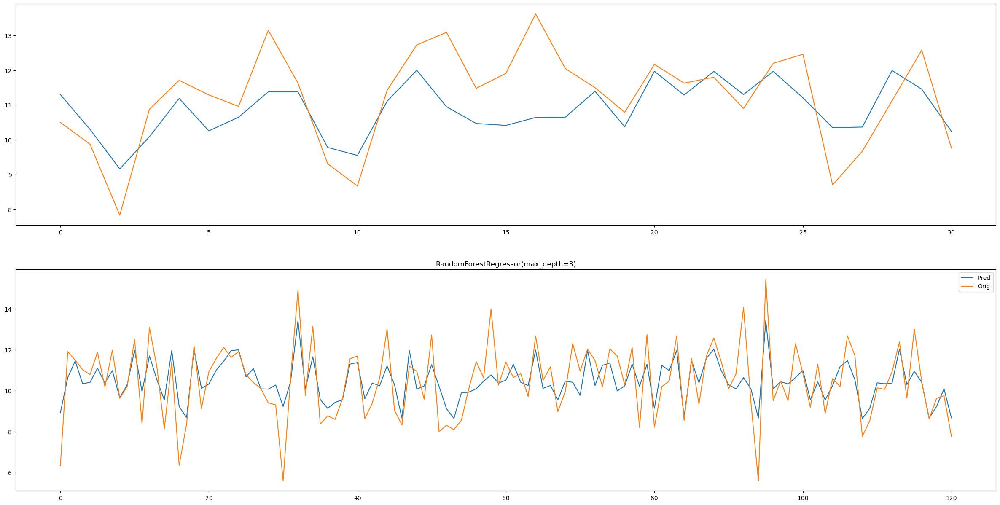

In [65]:
model = RandomForestRegressor(max_depth = 3)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### SVR

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.017 total time=   0.0s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.014 total time=   0.0s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.001 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.003 total time=   0.0s
[CV 5/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.048 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.002 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.022 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.016 total time=   0.0s
[CV 4/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.005 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.063 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.004 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.257 total time=   0.0s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.245 total time=   0.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.195 total time=   0.0s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.134 total time=   0.0s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.204 total time=   0.0s
[CV 4/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.165 total time=   0.0s
[CV 5/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.154 total time=   0.0s
[CV 1/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.127 total time=   0.0s
[CV 2/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.126 total time=   0.0s
[CV 3/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.133 total time=   0.0s
[CV 4/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.095 total time=   0.0s
[CV 5/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.096 total time=   0.0s
[CV 1/5] END ..C=1000, gamma

[CV 1/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.030 total time=   0.0s
[CV 2/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.007 total time=   0.0s
[CV 3/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.045 total time=   0.0s
[CV 4/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 5/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.002 total time=   0.0s
[CV 1/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.061 total time=   0.0s
[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.224 total time=   0.0s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.540 total time=   0.0s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.421 total time=   0.0s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.154 total time=   0.0s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.171 total time=   0.0s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.169 total time=   0.0s
[CV 3/5] END .....C=1000, ga

[CV 4/5] END ...C=100, gamma=0.001, kernel=rbf;, score=-0.011 total time=   0.0s
[CV 5/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.004 total time=   0.0s
[CV 1/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.007 total time=   0.0s
[CV 2/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.000 total time=   0.0s
[CV 3/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.053 total time=   0.0s
[CV 4/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.024 total time=   0.0s
[CV 5/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.014 total time=   0.0s
[CV 1/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.413 total time=   0.0s
[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.498 total time=   0.0s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.475 total time=   0.0s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.387 total time=   0.0s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.157 total time=   0.0s
[CV 1/5] END .....C=1000, ga

[CV 2/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.023 total time=   0.0s
[CV 3/5] END ...C=100, gamma=0.001, kernel=rbf;, score=-0.037 total time=   0.0s
[CV 4/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.008 total time=   0.0s
[CV 5/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.016 total time=   0.0s
[CV 1/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.001 total time=   0.0s
[CV 2/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.000 total time=   0.0s
[CV 3/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.045 total time=   0.0s
[CV 4/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.002 total time=   0.0s
[CV 5/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.002 total time=   0.0s
[CV 1/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.366 total time=   0.0s
[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.191 total time=   0.0s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.363 total time=   0.0s
[CV 4/5] END .......C=1000, 

[CV 3/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.096 total time=   0.0s
[CV 4/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.162 total time=   0.0s
[CV 5/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.097 total time=   0.0s
[CV 1/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.016 total time=   0.0s
[CV 2/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.028 total time=   0.0s
[CV 3/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.019 total time=   0.0s
[CV 4/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.029 total time=   0.0s
[CV 5/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.019 total time=   0.0s
[CV 1/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.001 total time=   0.0s
[CV 2/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.000 total time=   0.0s
[CV 3/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.002 total time=   0.0s
[CV 4/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.003 total time=   0.0s
[CV 5/5] END ...C=100, gamma

[CV 2/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.141 total time=   0.0s
[CV 3/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.070 total time=   0.0s
[CV 4/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.126 total time=   0.0s
[CV 5/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.060 total time=   0.0s
[CV 1/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.005 total time=   0.0s
[CV 2/5] END ...C=100, gamma=0.001, kernel=rbf;, score=-0.021 total time=   0.0s
[CV 3/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.010 total time=   0.0s
[CV 4/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.002 total time=   0.0s
[CV 5/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.009 total time=   0.0s
[CV 1/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.010 total time=   0.0s
[CV 2/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.043 total time=   0.0s
[CV 3/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.005 total time=   0.0s
[CV 4/5] END ..C=100, gamma=

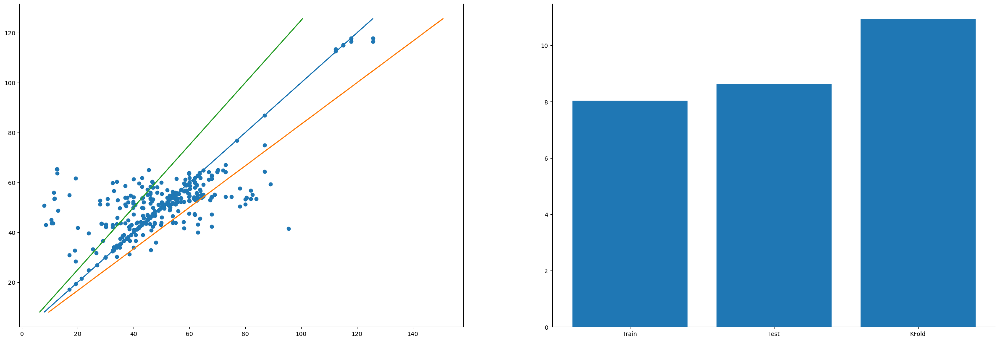

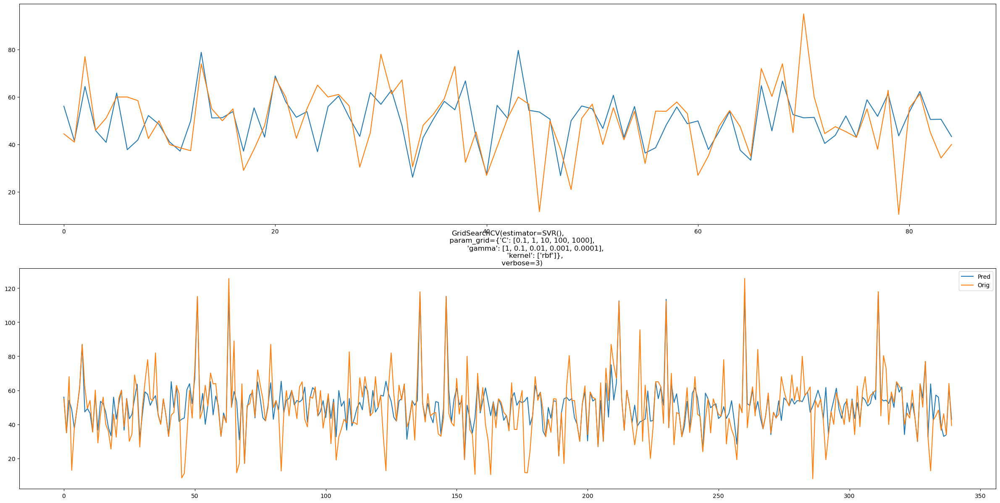

In [66]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.089 total time=   0.0s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.012 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.266 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.178 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.161 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.041 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.100 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.057 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.033 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.041 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.063 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

[CV 4/5] END ....C=1000, gamma=0.1, kernel=rbf;, score=-0.618 total time=   0.0s
[CV 5/5] END ....C=1000, gamma=0.1, kernel=rbf;, score=-0.137 total time=   0.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.423 total time=   0.0s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.698 total time=   0.0s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.409 total time=   0.0s
[CV 4/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.595 total time=   0.0s
[CV 5/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.021 total time=   0.0s
[CV 1/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.414 total time=   0.0s
[CV 2/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.526 total time=   0.0s
[CV 3/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.504 total time=   0.0s
[CV 4/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.607 total time=   0.0s
[CV 5/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.033 total time=   0.0s
[CV 1/5] END ..C=1000, gamma

[CV 5/5] END ...C=1000, gamma=0.01, kernel=rbf;, score=-0.109 total time=   0.0s
[CV 1/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.298 total time=   0.0s
[CV 2/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.370 total time=   0.0s
[CV 3/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.678 total time=   0.0s
[CV 4/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.365 total time=   0.0s
[CV 5/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.045 total time=   0.0s
[CV 1/5] END .C=1000, gamma=0.0001, kernel=rbf;, score=-0.128 total time=   0.0s
[CV 2/5] END ..C=1000, gamma=0.0001, kernel=rbf;, score=0.356 total time=   0.0s
[CV 3/5] END ..C=1000, gamma=0.0001, kernel=rbf;, score=0.271 total time=   0.0s
[CV 4/5] END ..C=1000, gamma=0.0001, kernel=rbf;, score=0.191 total time=   0.0s
[CV 5/5] END ..C=1000, gamma=0.0001, kernel=rbf;, score=0.253 total time=   0.0s
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .......C=0.1, gamma=1, kernel=rbf;

[CV 5/5] END ....C=0.1, gamma=0.001, kernel=rbf;, score=0.000 total time=   0.0s
[CV 1/5] END ..C=0.1, gamma=0.0001, kernel=rbf;, score=-0.085 total time=   0.0s
[CV 2/5] END ..C=0.1, gamma=0.0001, kernel=rbf;, score=-0.084 total time=   0.0s
[CV 3/5] END ..C=0.1, gamma=0.0001, kernel=rbf;, score=-0.016 total time=   0.0s
[CV 4/5] END ..C=0.1, gamma=0.0001, kernel=rbf;, score=-0.139 total time=   0.0s
[CV 5/5] END ..C=0.1, gamma=0.0001, kernel=rbf;, score=-0.000 total time=   0.0s
[CV 1/5] END ..........C=1, gamma=1, kernel=rbf;, score=0.467 total time=   0.0s
[CV 2/5] END ..........C=1, gamma=1, kernel=rbf;, score=0.448 total time=   0.0s
[CV 3/5] END ..........C=1, gamma=1, kernel=rbf;, score=0.679 total time=   0.0s
[CV 4/5] END ..........C=1, gamma=1, kernel=rbf;, score=0.276 total time=   0.0s
[CV 5/5] END ..........C=1, gamma=1, kernel=rbf;, score=0.063 total time=   0.0s
[CV 1/5] END ........C=1, gamma=0.1, kernel=rbf;, score=0.144 total time=   0.0s
[CV 2/5] END .......C=1, gam

[CV 4/5] END ......C=10, gamma=0.01, kernel=rbf;, score=0.221 total time=   0.0s
[CV 5/5] END ......C=10, gamma=0.01, kernel=rbf;, score=0.214 total time=   0.0s
[CV 1/5] END ....C=10, gamma=0.001, kernel=rbf;, score=-0.037 total time=   0.0s
[CV 2/5] END ....C=10, gamma=0.001, kernel=rbf;, score=-0.073 total time=   0.0s
[CV 3/5] END .....C=10, gamma=0.001, kernel=rbf;, score=0.031 total time=   0.0s
[CV 4/5] END ....C=10, gamma=0.001, kernel=rbf;, score=-0.019 total time=   0.0s
[CV 5/5] END .....C=10, gamma=0.001, kernel=rbf;, score=0.046 total time=   0.0s
[CV 1/5] END ...C=10, gamma=0.0001, kernel=rbf;, score=-0.057 total time=   0.0s
[CV 2/5] END ...C=10, gamma=0.0001, kernel=rbf;, score=-0.070 total time=   0.0s
[CV 3/5] END ....C=10, gamma=0.0001, kernel=rbf;, score=0.003 total time=   0.0s
[CV 4/5] END ...C=10, gamma=0.0001, kernel=rbf;, score=-0.091 total time=   0.0s
[CV 5/5] END ....C=10, gamma=0.0001, kernel=rbf;, score=0.001 total time=   0.0s
[CV 1/5] END ........C=100, 

[CV 2/5] END ..C=100, gamma=0.0001, kernel=rbf;, score=-0.106 total time=   0.0s
[CV 3/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.029 total time=   0.0s
[CV 4/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.035 total time=   0.0s
[CV 5/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.029 total time=   0.0s
[CV 1/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.153 total time=   0.0s
[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.056 total time=   0.0s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.633 total time=   0.0s
[CV 4/5] END ......C=1000, gamma=1, kernel=rbf;, score=-1.557 total time=   0.0s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.313 total time=   0.0s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.466 total time=   0.0s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.550 total time=   0.0s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.824 total time=   0.0s
[CV 4/5] END .....C=1000, ga

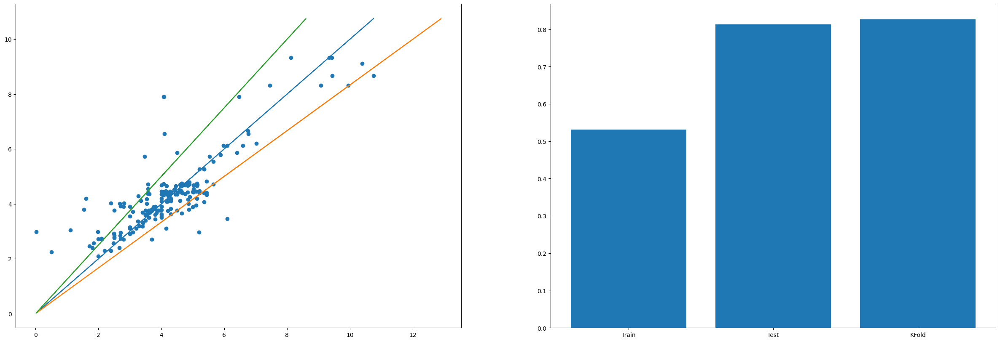

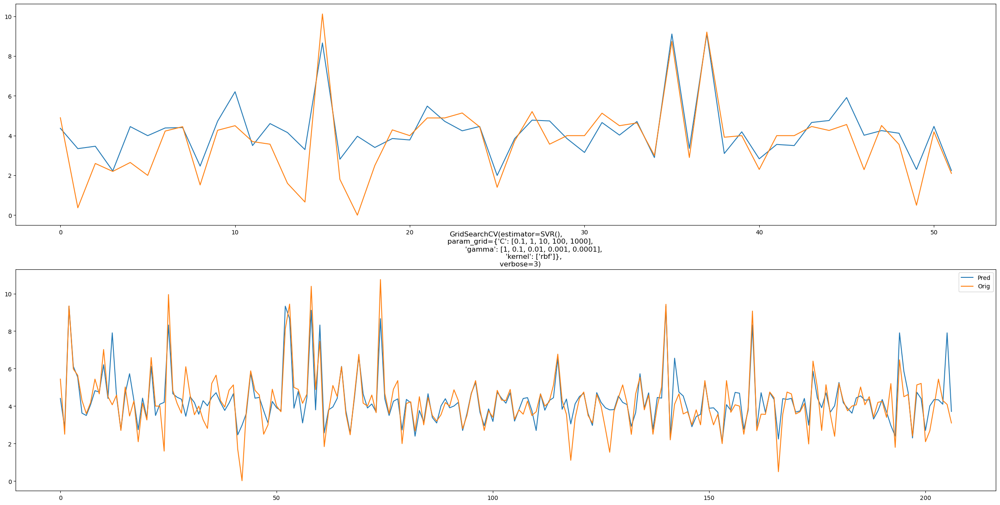

In [67]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.069 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.022 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.062 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.120 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.074 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.003 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.060 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.006 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.076 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.010 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

Train r2:  0.6748700146431674
Train MAE:  0.5977260187937518
Train RMSE:  1.0081750041113395
Test r2:  0.34622663960941225
Test MAE:  0.7984356324009722
Test RMSE:  1.1071503598782342
Scatter Index: 9.684460330078242
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.027 total time=   0.0s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.022 total time=   0.0s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.127 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.041 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.106 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.009 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.020 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.210 total time=   0.0s
[CV 4/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.031 total time=

[CV 2/5] END .......C=1, gamma=0.01, kernel=rbf;, score=0.015 total time=   0.0s
[CV 3/5] END ......C=1, gamma=0.01, kernel=rbf;, score=-0.043 total time=   0.0s
[CV 4/5] END .......C=1, gamma=0.01, kernel=rbf;, score=0.007 total time=   0.0s
[CV 5/5] END ......C=1, gamma=0.01, kernel=rbf;, score=-0.127 total time=   0.0s
[CV 1/5] END .....C=1, gamma=0.001, kernel=rbf;, score=-0.019 total time=   0.0s
[CV 2/5] END ......C=1, gamma=0.001, kernel=rbf;, score=0.001 total time=   0.0s
[CV 3/5] END .....C=1, gamma=0.001, kernel=rbf;, score=-0.047 total time=   0.0s
[CV 4/5] END .....C=1, gamma=0.001, kernel=rbf;, score=-0.008 total time=   0.0s
[CV 5/5] END .....C=1, gamma=0.001, kernel=rbf;, score=-0.144 total time=   0.0s
[CV 1/5] END ....C=1, gamma=0.0001, kernel=rbf;, score=-0.020 total time=   0.0s
[CV 2/5] END ....C=1, gamma=0.0001, kernel=rbf;, score=-0.001 total time=   0.0s
[CV 3/5] END ....C=1, gamma=0.0001, kernel=rbf;, score=-0.047 total time=   0.0s
[CV 4/5] END ....C=1, gamma=

[CV 2/5] END ........C=100, gamma=1, kernel=rbf;, score=0.650 total time=   0.0s
[CV 3/5] END ........C=100, gamma=1, kernel=rbf;, score=0.038 total time=   0.0s
[CV 4/5] END ........C=100, gamma=1, kernel=rbf;, score=0.227 total time=   0.0s
[CV 5/5] END ........C=100, gamma=1, kernel=rbf;, score=0.649 total time=   0.0s
[CV 1/5] END ......C=100, gamma=0.1, kernel=rbf;, score=0.224 total time=   0.0s
[CV 2/5] END ......C=100, gamma=0.1, kernel=rbf;, score=0.445 total time=   0.0s
[CV 3/5] END .....C=100, gamma=0.1, kernel=rbf;, score=-0.331 total time=   0.0s
[CV 4/5] END ......C=100, gamma=0.1, kernel=rbf;, score=0.373 total time=   0.0s
[CV 5/5] END ......C=100, gamma=0.1, kernel=rbf;, score=0.342 total time=   0.0s
[CV 1/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.262 total time=   0.0s
[CV 2/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.418 total time=   0.0s
[CV 3/5] END ....C=100, gamma=0.01, kernel=rbf;, score=-0.154 total time=   0.0s
[CV 4/5] END .....C=100, gam

[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.046 total time=   0.0s
[CV 4/5] END ....C=1000, gamma=0.1, kernel=rbf;, score=-0.234 total time=   0.0s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.314 total time=   0.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.276 total time=   0.0s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.263 total time=   0.0s
[CV 3/5] END ...C=1000, gamma=0.01, kernel=rbf;, score=-0.168 total time=   0.0s
[CV 4/5] END ...C=1000, gamma=0.01, kernel=rbf;, score=-0.163 total time=   0.0s
[CV 5/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.322 total time=   0.0s
[CV 1/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.145 total time=   0.0s
[CV 2/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.227 total time=   0.0s
[CV 3/5] END ..C=1000, gamma=0.001, kernel=rbf;, score=-0.272 total time=   0.0s
[CV 4/5] END ..C=1000, gamma=0.001, kernel=rbf;, score=-0.243 total time=   0.0s
[CV 5/5] END ...C=1000, gamm

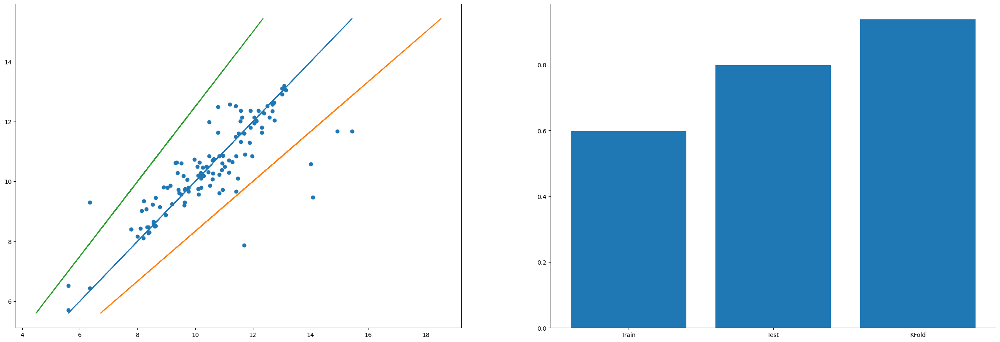

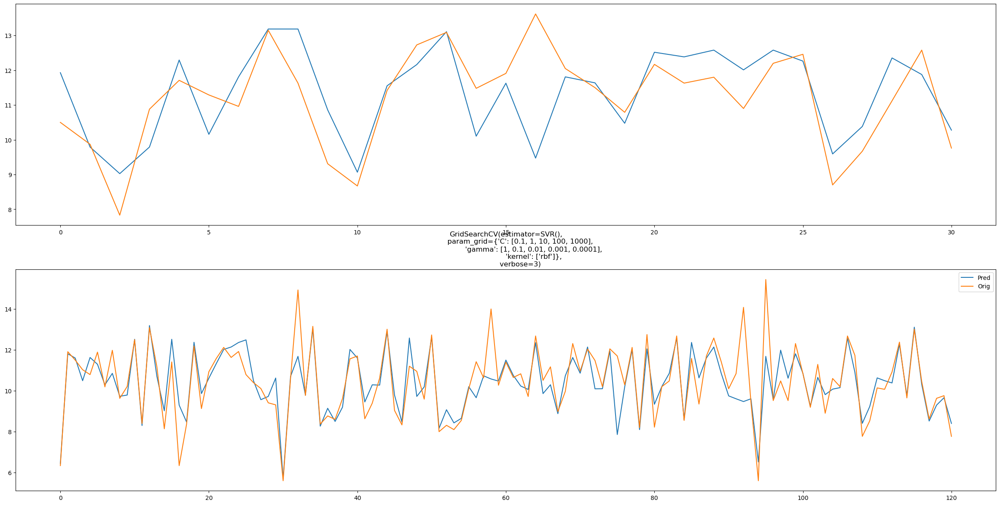

In [68]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [69]:
pickle.dump(model, open('fs.sav', 'wb'))

### XGBoost

[13:33:24] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

Train r2:  0.25441783723311095
Train MAE:  11.858568904697195
Train RMSE:  16.22511883564091
Test r2:  0.08288991095293785
Test MAE:  10.388184118831859
Test RMSE:  13.735690758651788
Scatter Index: 32.323964785470174
[13:33:24] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[13:33:24] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[13:33:24] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "ma

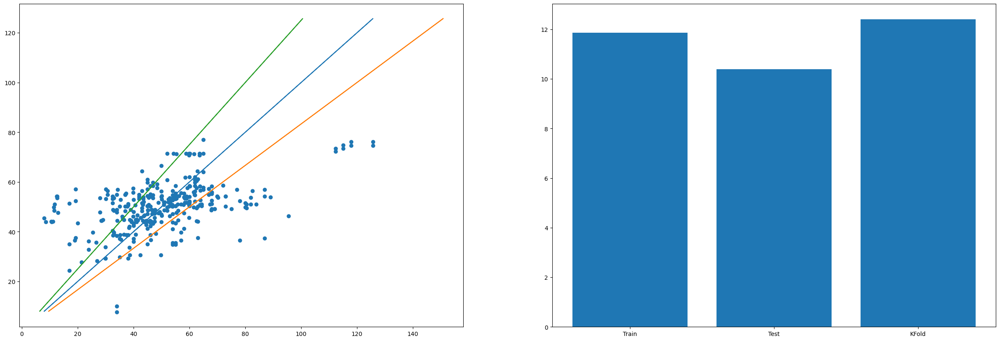

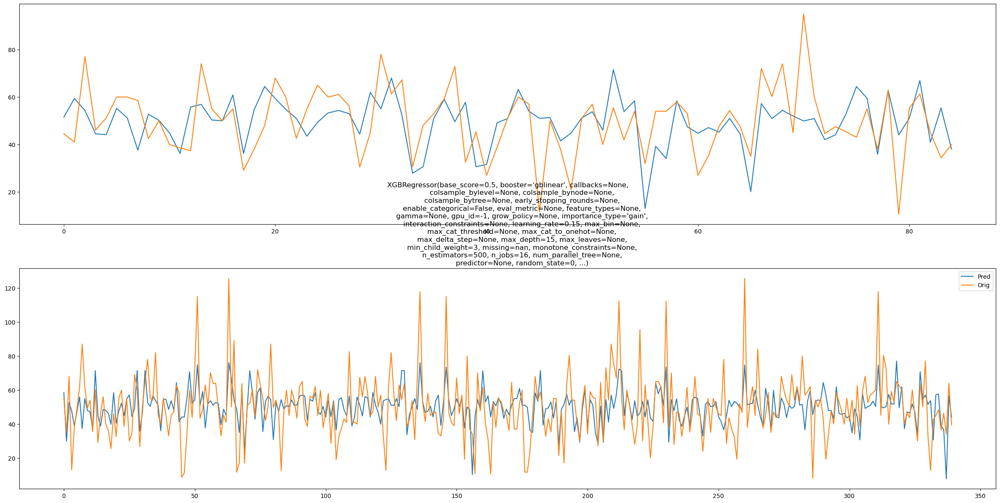

In [70]:
from xgboost import XGBRegressor
model = XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.15, max_delta_step=None, max_depth=15,
             min_child_weight=3, monotone_constraints=None,
             n_estimators=500, n_jobs=16, num_parallel_tree=None,
             random_state=0, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
             subsample=None, tree_method=None, validate_parameters=1,
             verbosity=None)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

[13:33:25] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

Train r2:  0.6244801280681943
Train MAE:  0.7254041947719554
Train RMSE:  0.9558006385367035
Test r2:  0.6470509266541611
Test MAE:  0.8465421114518092
Test RMSE:  1.1470697531956686
Scatter Index: 22.511033895810197
[13:33:25] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[13:33:25] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[13:33:25] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max

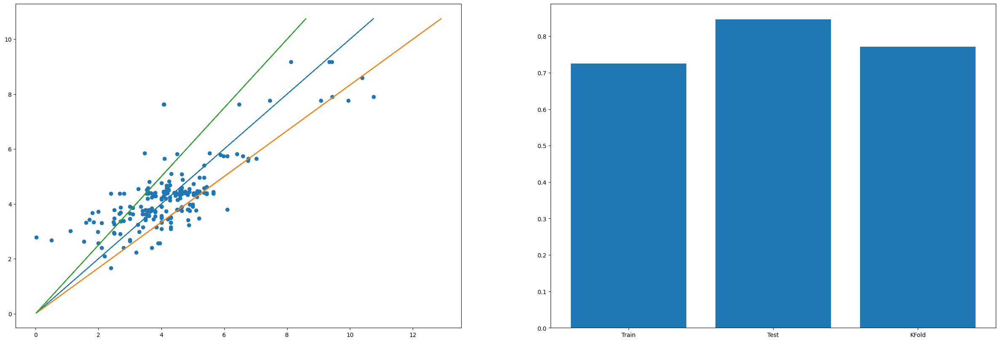

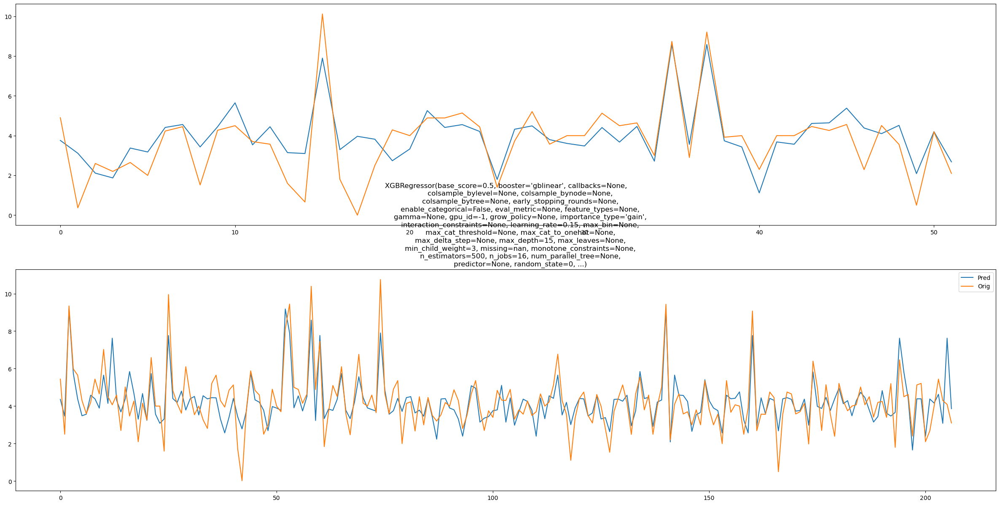

In [71]:
model = XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.15, max_delta_step=None, max_depth=15,
             min_child_weight=3, monotone_constraints=None,
             n_estimators=500, n_jobs=16, num_parallel_tree=None,
             random_state=0, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
             subsample=None, tree_method=None, validate_parameters=1,
             verbosity=None)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

[13:33:26] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

Train r2:  0.34869010488594165
Train MAE:  1.1092672470975513
Train RMSE:  1.4269253438389473
Test r2:  0.12582817100373445
Test MAE:  0.9856965348028369
Test RMSE:  1.2802400195581043
Scatter Index: 13.650086894441865
[13:33:26] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[13:33:26] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[13:33:26] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_b2k4a2hea3/croot/xgboost-split_1675457783214/work/src/learner.cc:767: 
Parameters: { "m

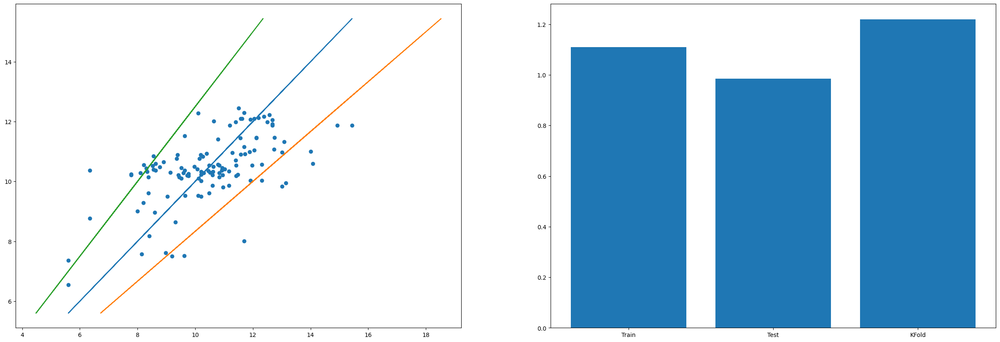

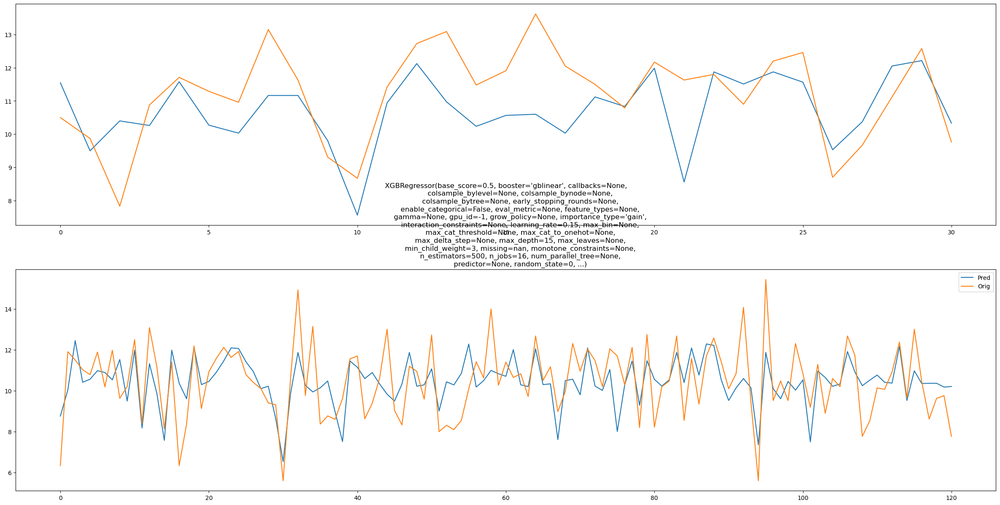

In [72]:
model = XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.15, max_delta_step=None, max_depth=15,
             min_child_weight=3, monotone_constraints=None,
             n_estimators=500, n_jobs=16, num_parallel_tree=None,
             random_state=0, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
             subsample=None, tree_method=None, validate_parameters=1,
             verbosity=None)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### ANN

Train r2:  0.45118583798930867
Train MAE:  10.090044971381143
Train RMSE:  13.920434349122463
Test r2:  0.23191498586207915
Test MAE:  9.314986505844146
Test RMSE:  12.570264469616317
Scatter Index: 27.443686672867617
K Fold MAE: 11.733788346880749


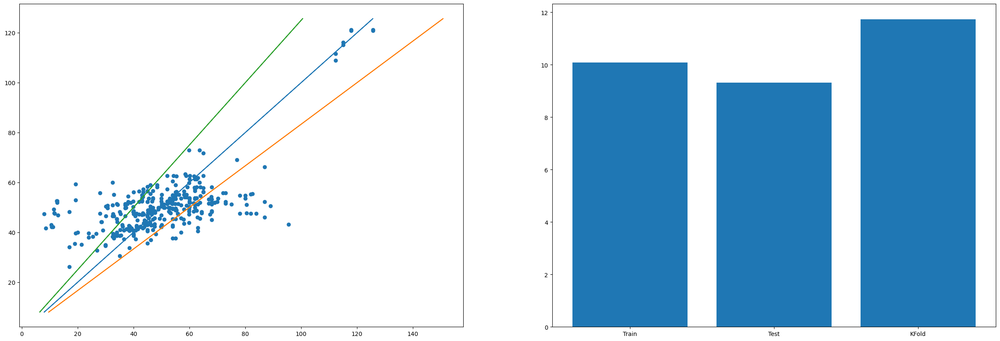

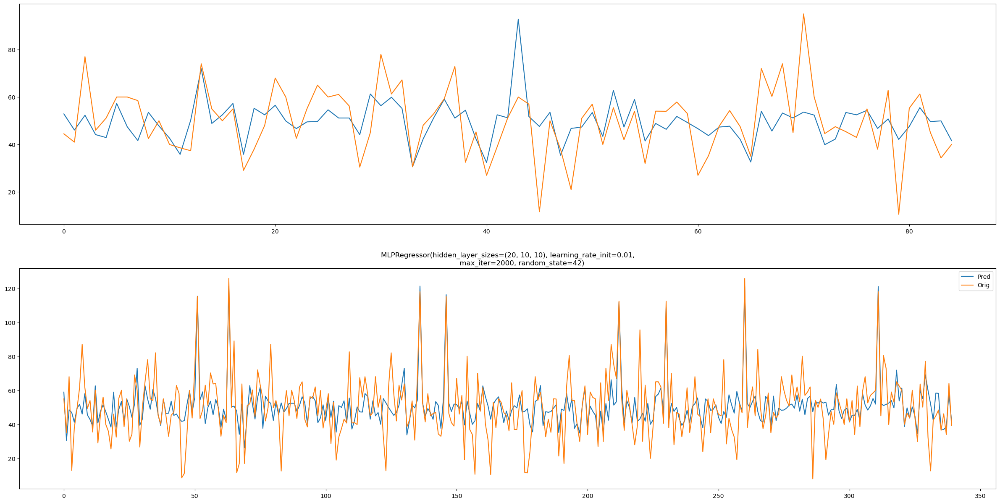

In [73]:
from sklearn.neural_network import MLPRegressor
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), random_state=42, max_iter=2000, momentum=0.9, learning_rate_init = 0.01)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.6150437959611775
Train MAE:  0.7167495191233209
Train RMSE:  0.9677351502398298
Test r2:  0.6508143907656843
Test MAE:  0.8294054888716715
Test RMSE:  1.140937812684259
Scatter Index: 22.821454532581942
K Fold MAE: 0.7606726099327904


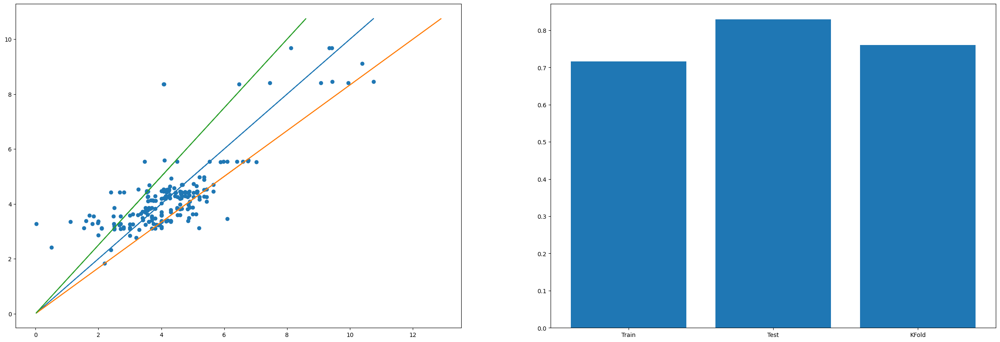

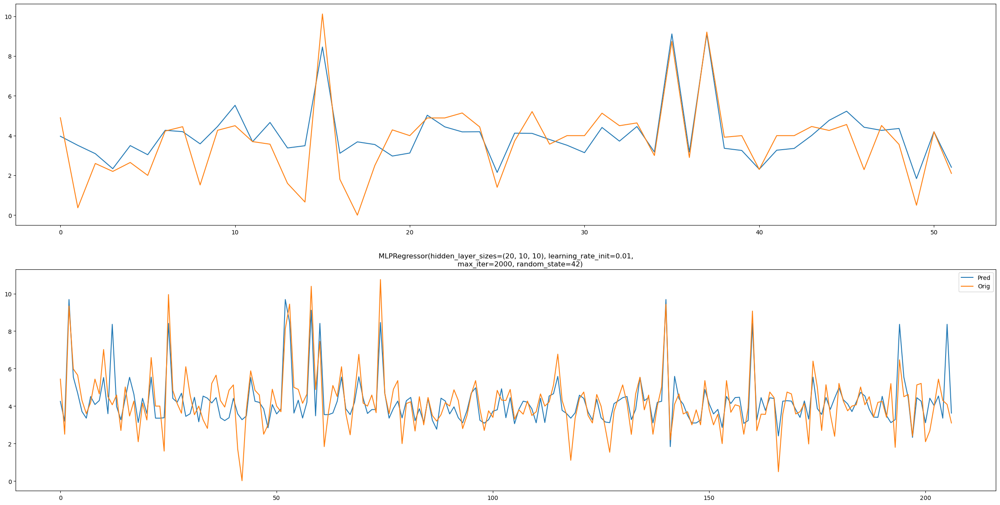

In [74]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), random_state=42, max_iter=2000, momentum=0.9, learning_rate_init = 0.01)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.7424400005204888
Train MAE:  0.6648158052097528
Train RMSE:  0.8973184990313328
Test r2:  0.09290247320916878
Test MAE:  1.0664419471332547
Test RMSE:  1.3041273016226984
Scatter Index: 8.537791696443815
K Fold MAE: 0.8907431789545773


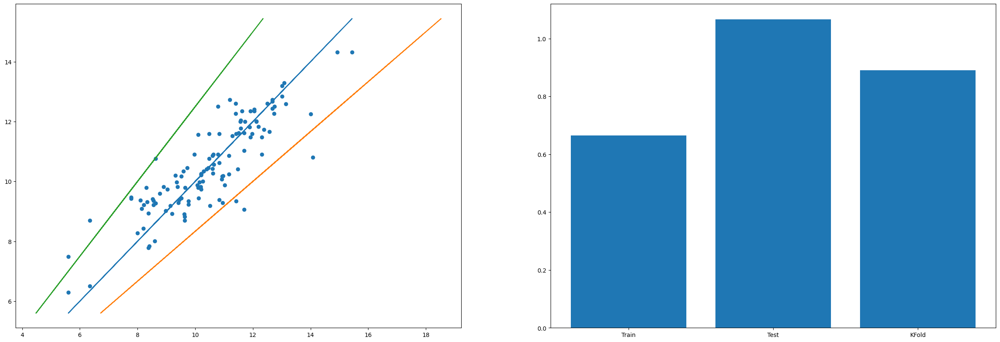

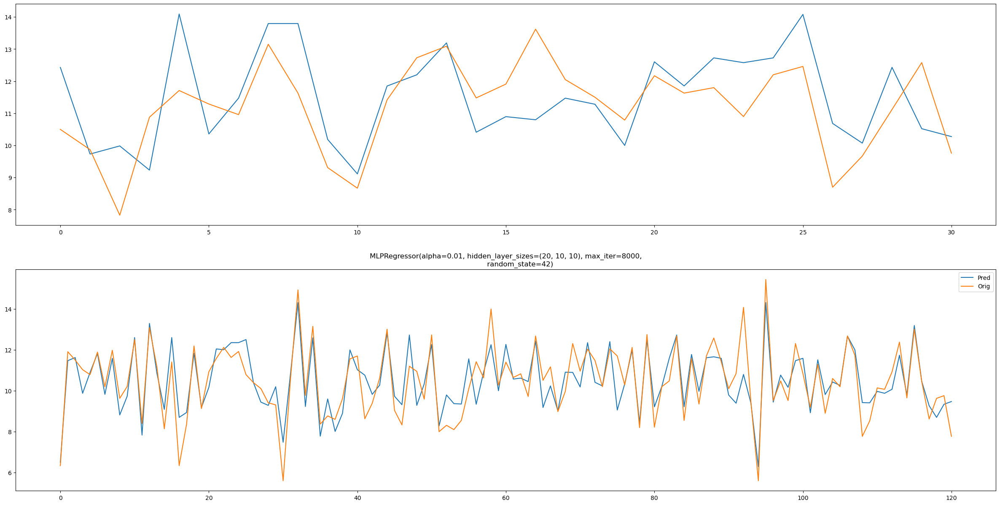

In [75]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

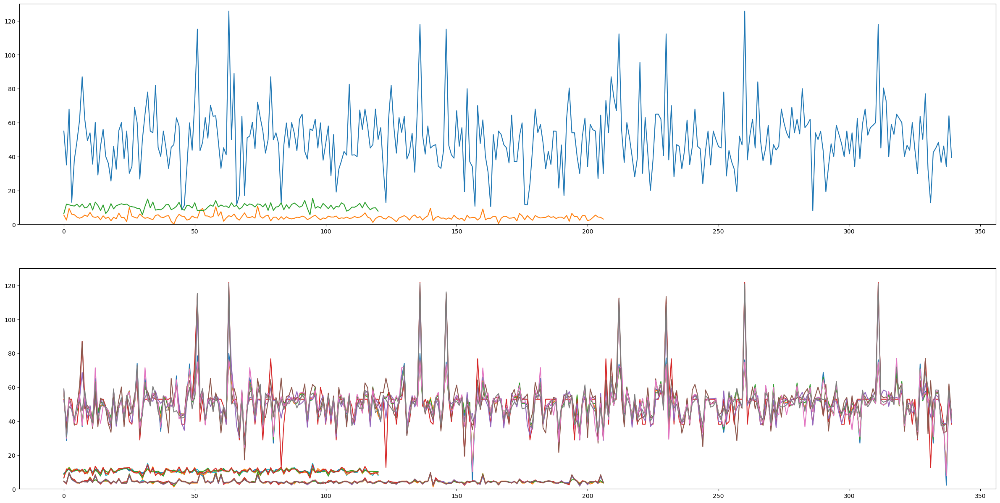

In [76]:
fig, ax = plt.subplots(2, 1)
fig.set_figheight(15)
fig.set_figwidth(30)
ax[0].set_ylim((0, 130))
ax[1].set_ylim((0, 130))
ax[0].plot(range(len(cs_y_train)), cs_y_train, label='CS')
ax[0].plot(range(len(ts_y_train)), ts_y_train, label='TS')
ax[0].plot(range(len(fs_y_train)), fs_y_train, label='FS')
for k1 in final_preds.keys():
    for k2 in range(len(final_preds[k1])):
        for k in final_preds[k1][k2].keys():
            ax[1].plot(range(len(final_preds[k1][k2][k])), final_preds[k1][k2][k])

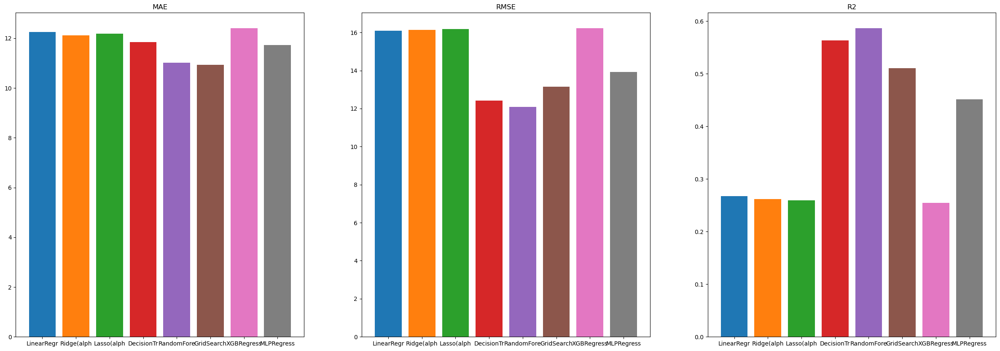

In [77]:
cs_mae, cs_rmse, cs_r2 = final_mae['CS'], final_rmse['CS'], final_r2['CS']
fig, ax = plt.subplots(1,3)
fig.set_figheight(10)
fig.set_figwidth(30)
ax[0].set_title('MAE')
for k in range(len(cs_mae)):
    for k1 in cs_mae[k].keys():
        ax[0].bar(k1[:10], cs_mae[k][k1])
ax[1].set_title('RMSE')
for k in range(len(cs_rmse)):
    for k1 in cs_rmse[k].keys():
        ax[1].bar(k1[:10], cs_rmse[k][k1])
ax[2].set_title('R2')
for k in range(len(cs_r2)):
    for k1 in cs_r2[k].keys():
        ax[2].bar(k1[:10], cs_r2[k][k1])

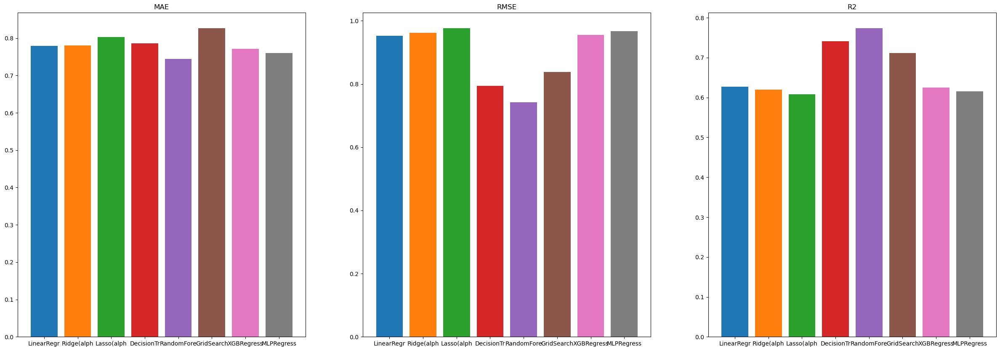

In [78]:
ts_mae, ts_rmse, ts_r2 = final_mae['TS'], final_rmse['TS'], final_r2['TS']
fig, ax = plt.subplots(1,3)
fig.set_figheight(10)
fig.set_figwidth(30)
ax[0].set_title('MAE')
for k in range(len(ts_mae)):
    for k1 in ts_mae[k].keys():
        ax[0].bar(k1[:10], ts_mae[k][k1])
ax[1].set_title('RMSE')
for k in range(len(ts_rmse)):
    for k1 in ts_rmse[k].keys():
        ax[1].bar(k1[:10], ts_rmse[k][k1])
ax[2].set_title('R2')
for k in range(len(ts_r2)):
    for k1 in ts_r2[k].keys():
        ax[2].bar(k1[:10], ts_r2[k][k1])

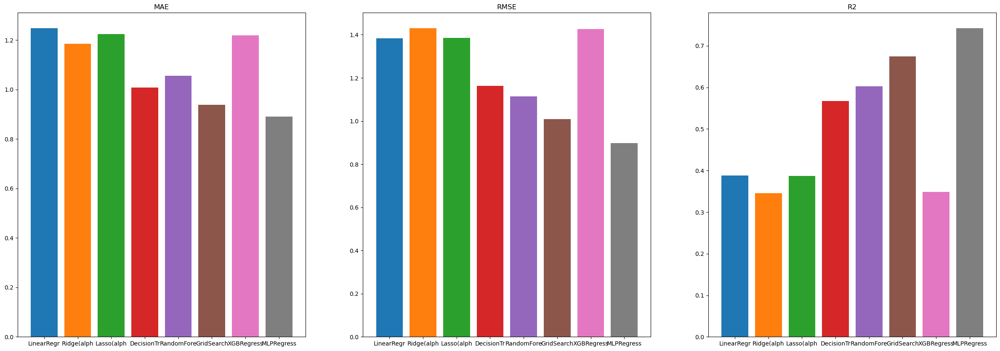

In [79]:
fs_mae, fs_rmse, fs_r2 = final_mae['FS'], final_rmse['FS'], final_r2['FS']
fig, ax = plt.subplots(1,3)
fig.set_figheight(10)
fig.set_figwidth(30)
ax[0].set_title('MAE')
for k in range(len(fs_mae)):
    for k1 in fs_mae[k].keys():
        ax[0].bar(k1[:10], fs_mae[k][k1])
ax[1].set_title('RMSE')
for k in range(len(fs_rmse)):
    for k1 in fs_rmse[k].keys():
        ax[1].bar(k1[:10], fs_rmse[k][k1])
ax[2].set_title('R2')
for k in range(len(fs_r2)):
    for k1 in fs_r2[k].keys():
        ax[2].bar(k1[:10], fs_r2[k][k1])

In [80]:
df_cs = pd.DataFrame()
for k1 in range(len(final_preds['CS'])):
        df = pd.DataFrame.from_dict(final_preds['CS'][k1])
        df_cs = pd.concat([df_cs, df], axis=1)
df_cs = pd.concat([df_cs, train_cs], axis=1)

df_ts = pd.DataFrame()
for k1 in range(len(final_preds['TS'])):
        df = pd.DataFrame.from_dict(final_preds['TS'][k1])
        df_ts = pd.concat([df_ts, df], axis=1)
df_ts = pd.concat([df_ts, train_ts], axis=1)

df_fs = pd.DataFrame()
for k1 in range(len(final_preds['FS'])):
        df = pd.DataFrame.from_dict(final_preds['FS'][k1])
        df_fs = pd.concat([df_fs, df], axis=1)
df_fs = pd.concat([df_fs, train_fs], axis=1)
df_fs.columns        

Index(['LinearRegression()', 'Ridge(alpha=0.5)', 'Lasso(alpha=0.001)',
       'DecisionTreeRegressor(max_depth=5)',
       'RandomForestRegressor(max_depth=3)',
       'GridSearchCV(estimator=SVR(),\n             param_grid={'C': [0.1, 1, 10, 100, 1000],\n                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n                         'kernel': ['rbf']},\n             verbose=3)',
       'XGBRegressor(base_score=0.5, booster='gblinear', callbacks=None,\n             colsample_bylevel=None, colsample_bynode=None,\n             colsample_bytree=None, early_stopping_rounds=None,\n             enable_categorical=False, eval_metric=None, feature_types=None,\n             gamma=None, gpu_id=-1, grow_policy=None, importance_type='gain',\n             interaction_constraints=None, learning_rate=0.15, max_bin=None,\n             max_cat_threshold=None, max_cat_to_onehot=None,\n             max_delta_step=None, max_depth=15, max_leaves=None,\n             min_child_weight=3, missing=na

In [83]:
df_cs.head()

,LinearRegression(),Ridge(alpha=0.5),Lasso(alpha=0.05),DecisionTreeRegressor(max_depth=5),RandomForestRegressor(max_depth=5),"GridSearchCV(estimator=SVR(),\n param_grid={'C': [0.1, 1, 10, 100, 1000],\n 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n 'kernel': ['rbf']},\n verbose=3)","XGBRegressor(base_score=0.5, booster='gblinear', callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, gpu_id=-1, grow_policy=None, importance_type='gain',\n interaction_constraints=None, learning_rate=0.15, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=15, max_leaves=None,\n min_child_weight=3, missing=nan, monotone_constraints=None,\n n_estimators=500, n_jobs=16, num_parallel_tree=None,\n predictor=None, random_state=0, ...)","MLPRegressor(hidden_layer_sizes=(20, 10, 10), learning_rate_init=0.01,\n max_iter=2000, random_state=42)",Actual
0,58.282688,57.557075,57.485990,52.867265,52.281157,56.000099,58.402237,58.956904,55.0
1,28.507441,31.829846,30.893780,38.095000,39.942476,35.099513,29.839380,30.538902,35.0
2,52.484304,52.239445,51.915898,52.867265,52.827580,54.108847,52.633781,48.542899,68.0
3,48.034195,47.954830,47.922752,52.867265,46.351321,48.746019,47.623741,46.962077,13.0
4,39.028378,39.473794,39.960321,38.066481,39.248539,37.536046,38.808311,41.199545,38.0


In [84]:
df_cs.to_excel('Results_CS.xlsx', index=False)
df_ts.to_excel('Results_TS.xlsx', index=False)
df_fs.to_excel('Results_FS.xlsx', index=False)